# ***PROJECT INTRODUCTION***  
***Project by***  
MD MASHFIQUR RAHMAN  
ROLL - 1903017   


***Submitted to***  
***Prof. Dr. Md. Al Mamun***  
 Professor  
Department of Computer Science & Engineering, RUET  
  
    
      
        
        

# ***Mounting Drive***

In [1]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


# ***Importing necessary libraries***

In [2]:
import os
import random
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
plt.style.use("ggplot")

import cv2
from tqdm import tqdm_notebook, tnrange
from glob import glob
from itertools import chain
from skimage.io import imread, imshow, concatenate_images
from skimage.transform import resize
from skimage.morphology import label
from sklearn.model_selection import train_test_split

import tensorflow as tf
from skimage.color import rgb2gray
from tensorflow.keras import Input
from tensorflow.keras.models import Model, load_model, save_model
from tensorflow.keras.layers import Input, Activation, BatchNormalization, Dropout, Lambda, Conv2D, Conv2DTranspose, MaxPooling2D, concatenate
from tensorflow.keras.optimizers import Adam
from tensorflow.keras.callbacks import EarlyStopping, ModelCheckpoint

from tensorflow.keras import backend as K
from tensorflow.keras.preprocessing.image import ImageDataGenerator

# ***Implementinng U-Net***

In [3]:
def unet(input_size = (256, 256, 3)):
  inputs = Input(input_size)

  # Encoding segment
  conv1 = Conv2D(filters = 64, kernel_size = (3,3), padding = 'same')(inputs)
  batch_normalization_1 = Activation('relu')(conv1)
  conv1 = Conv2D(filters = 64, kernel_size = (3,3), padding = 'same')(batch_normalization_1)
  batch_normalization_1 = Activation('relu')(conv1)
  batch_normalization_1 = Activation('relu')(batch_normalization_1)
  pool1 = MaxPooling2D(pool_size = (2,2))(batch_normalization_1)

  conv2 = Conv2D(filters = 128, kernel_size = (3,3), padding = 'same')(pool1)
  batch_normalization_2 = Activation('relu')(conv2)
  conv2 = Conv2D(filters = 128, kernel_size = (3,3), padding = 'same')(batch_normalization_2)
  batch_normalization_2 = Activation('relu')(conv2)
  batch_normalization_2 = Activation('relu')(batch_normalization_2)
  pool2 = MaxPooling2D(pool_size = (2,2))(batch_normalization_2)

  conv3 = Conv2D(filters = 256, kernel_size = (3,3), padding = 'same')(pool2)
  batch_normalization_3 = Activation('relu')(conv3)
  conv3 = Conv2D(filters = 256, kernel_size = (3,3), padding = 'same')(batch_normalization_3)
  batch_normalization_3 = Activation('relu')(conv3)
  batch_normalization_3 = Activation('relu')(batch_normalization_3)
  pool3 = MaxPooling2D(pool_size = (2,2))(batch_normalization_3)

  conv4 = Conv2D(filters = 512, kernel_size = (3,3), padding = 'same')(pool3)
  batch_normalization_4 = Activation('relu')(conv4)
  conv4 = Conv2D(filters = 512, kernel_size = (3,3), padding = 'same')(batch_normalization_4)
  batch_normalization_4 = Activation('relu')(conv4)
  batch_normalization_4 = Activation('relu')(batch_normalization_4)
  pool4 = MaxPooling2D(pool_size = (2,2))(batch_normalization_4)

  conv5 = Conv2D(filters = 1024, kernel_size = (3,3), padding = 'same')(pool4)
  batch_normalization_5 = Activation('relu')(conv5)
  conv5 = Conv2D(filters = 1024, kernel_size = (3,3), padding = 'same')(batch_normalization_5)
  batch_normalization_5 = Activation('relu')(conv5)
  batch_normalization_5 = Activation('relu')(batch_normalization_5)

  # Decoding segment
  conv6 = concatenate([Conv2DTranspose(512, kernel_size = (2,2), strides = (2,2), padding = 'same')(batch_normalization_5), conv4], axis = 3)
  batch_normalization_6 = Activation('relu')(conv6)
  conv6 = Conv2D(filters = 512, kernel_size = (3,3), padding = 'same')(batch_normalization_6)
  batch_normalization_6 = BatchNormalization(axis = 3)(conv6)
  batch_normalization_6 = Activation('relu')(batch_normalization_6)

  up7 = concatenate([Conv2DTranspose(256, kernel_size = (2, 2), strides = (2, 2), padding = "same")(batch_normalization_6), conv3], axis = 3)
  conv7 = Conv2D(filters = 256, kernel_size = (3, 3), padding = "same")(up7)
  batch_normalization_7 = Activation("relu")(conv7)
  conv7 = Conv2D(filters = 256, kernel_size = (3, 3), padding = "same")(batch_normalization_7)
  batch_normalization_7 = BatchNormalization(axis= 3)(conv7)
  batch_normalization_7 = Activation("relu")(batch_normalization_7)

  up8 = concatenate([Conv2DTranspose(128, kernel_size = (2, 2), strides = (2, 2), padding = "same")(batch_normalization_7), conv2], axis = 3)
  conv8 = Conv2D(filters = 128, kernel_size = (3, 3), padding = "same")(up8)
  batch_normalization_8 = Activation("relu")(conv8)
  conv8 = Conv2D(filters = 128, kernel_size = (3, 3), padding = "same")(batch_normalization_8)
  batch_normalization_8 = BatchNormalization(axis= 3)(conv8)
  batch_normalization_8 = Activation("relu")(batch_normalization_8)

  up9 = concatenate([Conv2DTranspose(64, kernel_size = (2, 2), strides = (2, 2), padding = "same")(batch_normalization_8), conv1], axis = 3)
  conv9 = Conv2D(filters = 64, kernel_size = (3, 3), padding = "same")(up9)
  batch_normalization_9 = Activation("relu")(conv9)
  conv9 = Conv2D(filters = 64, kernel_size = (3, 3), padding = "same")(batch_normalization_9)
  batch_normalization_9 = BatchNormalization(axis= 3)(conv9)
  batch_normalization_9 = Activation("relu")(batch_normalization_9)

  conv10 = Conv2D(filters = 1, kernel_size = (1,1), activation = 'sigmoid')(batch_normalization_9)

  return Model(inputs = [inputs], outputs = [conv10])

# ***Utility function***

In [4]:
def plot_from_img_path(rows, columns, list_img_path, list_mask_path):
  fig = plt.figure(figsize = (12,12))
  
  for i in range(1, rows * columns + 1):
    fig.add_subplot(rows, columns, i)
    img_path = list_img_path[i]
    mask_path = list_mask_path[i]
    image = cv2.imread(img_path)
    image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)
    mask = cv2.imread(mask_path)
    plt.imshow(image)
    plt.imshow(mask, alpha = 0.4)
plt.show

def normalise_and_diagnose(img, mask):
  img = img / 255
  mask = mask / 255
  mask[mask > 0.5] = 1
  mask[mask <= 0.5] = 0

  return [img, mask]

def dice_coefficient(y_true, y_pred, smooth = 100):
  y_true_flatten = K.flatten(y_true)
  y_pred_flatten = K.flatten(y_pred)
  
  intersection = K.sum(y_true_flatten * y_pred_flatten, axis=int(0))
  union = K.sum(y_true_flatten, axis=int(0)) + K.sum(y_pred_flatten, axis=int(0))
  return((2 * intersection + smooth) / (union + smooth))

def dice_coefficient_loss(y_true, y_pred, smooth = 100):
  return dice_coefficient(y_true, y_pred, smooth)

def intersection_over_union(y_true, y_pred, smooth = 100):
  intersection = K.sum(y_true * y_pred, axis=int(0))
  sum = K.sum(y_true, axis=int(0)) + K.sum(y_pred, axis=int(0))
  intersection_over_union = (intersection + smooth) / (sum - intersection + smooth)
  return intersection_over_union

def jaccard_distance(y_true, y_pred):
  y_true_flatten = K.flatten(y_true)
  y_pred_flatten = K.flatten(y_pred)
  return -intersection_over_union(y_true_flatten, y_pred_flatten)

# ***Setting size parameters for images***

In [5]:
im_width = 256
im_height = 256

# ***Loading the image and mask paths***

In [6]:
image_filenames_train = []

# Generating a list of all files containing the word 'mask'
mask_files = glob('/content/drive/MyDrive/dataset/kaggle_3m/*/*_mask*')

for i in mask_files:
  image_filenames_train.append(i.replace('_mask', ''))

# ***Printing length of image_filenames_train***

In [7]:
print("Number of files: ", len(image_filenames_train))

Number of files:  2783


# ***Printing 10 sample image from image_filenames_train***

In [8]:
print("10 Sample image file name:\n")
for i in range(10):
    print(image_filenames_train[i])
print("\n")

10 Sample image file name:

/content/drive/MyDrive/dataset/kaggle_3m/TCGA_HT_8113_19930809/TCGA_HT_8113_19930809_5.tif
/content/drive/MyDrive/dataset/kaggle_3m/TCGA_HT_8113_19930809/TCGA_HT_8113_19930809_16.tif
/content/drive/MyDrive/dataset/kaggle_3m/TCGA_HT_8113_19930809/TCGA_HT_8113_19930809_21.tif
/content/drive/MyDrive/dataset/kaggle_3m/TCGA_HT_8113_19930809/TCGA_HT_8113_19930809_18.tif
/content/drive/MyDrive/dataset/kaggle_3m/TCGA_HT_8113_19930809/TCGA_HT_8113_19930809_14.tif
/content/drive/MyDrive/dataset/kaggle_3m/TCGA_HT_8113_19930809/TCGA_HT_8113_19930809_4.tif
/content/drive/MyDrive/dataset/kaggle_3m/TCGA_HT_8113_19930809/TCGA_HT_8113_19930809_2.tif
/content/drive/MyDrive/dataset/kaggle_3m/TCGA_HT_8113_19930809/TCGA_HT_8113_19930809_11.tif
/content/drive/MyDrive/dataset/kaggle_3m/TCGA_HT_8113_19930809/TCGA_HT_8113_19930809_13.tif
/content/drive/MyDrive/dataset/kaggle_3m/TCGA_HT_8113_19930809/TCGA_HT_8113_19930809_9.tif




# ***Plotting some images and masks***

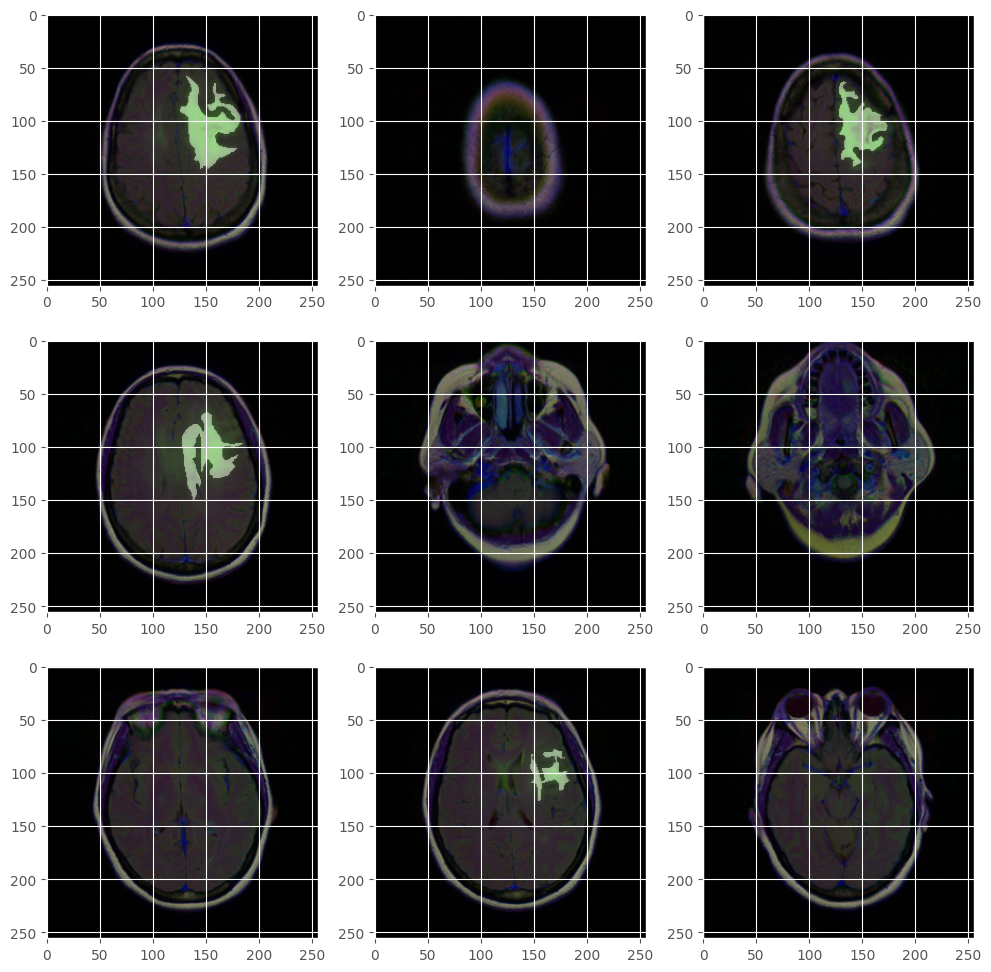

In [22]:
plot_from_img_path(3, 3, image_filenames_train, mask_files)

# ***Creating data frame and split data on train set, validation set and test set***

In [9]:
df = pd.DataFrame(data = {'image_filenames_train': image_filenames_train, 'mask': mask_files})
df_train, df_test = train_test_split(df, test_size = 0.1)

# Further splitting to validation and train
df_train, df_val = train_test_split(df_train, test_size = 0.2)

print(df_train.shape)
print(df_test.shape)
print(df_val.shape)

(2003, 2)
(279, 2)
(501, 2)


# ***Data generator, data augmentation and data adjustion***

In [10]:
def train_generator(
    data_frame,
    batch_size,
    augmentation_dict,
    image_color_mode = "rgb",
    mask_color_mode = "grayscale",
    image_save_prefix = "image",
    mask_save_prefix = "mask",
    save_to_dir  =None,
    target_size = (256, 256),
    seed = 1,
):
    
    image_datagen = ImageDataGenerator(**augmentation_dict)
    mask_datagen = ImageDataGenerator(**augmentation_dict)

    image_generator = image_datagen.flow_from_dataframe(
        data_frame,
        x_col = "image_filenames_train",
        class_mode = None,
        color_mode = image_color_mode,
        target_size = target_size,
        batch_size = batch_size,
        save_to_dir = save_to_dir,
        save_prefix = image_save_prefix,
        seed = seed,
    )

    mask_generator = mask_datagen.flow_from_dataframe(
        data_frame,
        x_col = "mask",
        class_mode = None,
        color_mode = mask_color_mode,
        target_size = target_size,
        batch_size = batch_size,
        save_to_dir = save_to_dir,
        save_prefix = mask_save_prefix,
        seed = seed,
    )

    train_gen = zip(image_generator, mask_generator)
    
    # Final return Tuple after image Normalization and Diagnostics
    for (img, mask) in train_gen:
        img, mask = normalise_and_diagnose(img, mask)
        yield (img, mask)

# ***Hyper Parameters***

In [11]:
EPOCHS = 20
BATCH_SIZE = 32
Learning_rate = 1e-4

# ***Training Section***

In [12]:
train_generator_param = dict(rotation_range = 0.2,
                             width_shift_range = 0.05,
                             height_shift_range = 0.05,
                             shear_range = 0.05,
                             zoom_range = 0.05,
                             horizontal_flip = True,
                             fill_mode = 'nearest'
)

train_gen = train_generator(df_train, BATCH_SIZE, train_generator_param, target_size = (im_height, im_width))
test_gen = train_generator(df_test, BATCH_SIZE, dict(), target_size = (im_height, im_width))

model = unet(input_size = (im_height, im_width, 3))

decay_rate = Learning_rate / EPOCHS

optimizer = tf.keras.optimizers.legacy.Adam(learning_rate = Learning_rate, beta_1 = 0.9, beta_2 = 0.999, epsilon = None, decay = decay_rate, amsgrad = False)

model.compile(optimizer = optimizer, loss = dice_coefficient_loss, metrics  = ['binary_accuracy', intersection_over_union, dice_coefficient])

callbacks = [ModelCheckpoint('/content/drive/MyDrive/unet.hdf5', verbose = 1, save_best_only = True)]

history = model.fit(train_gen,
                    steps_per_epoch = len(df_train) // BATCH_SIZE,
                    epochs = EPOCHS,
                    callbacks = callbacks,
                    validation_data = test_gen,
                    validation_steps = len(df_test) // BATCH_SIZE
)

Found 2003 validated image filenames.
Found 2003 validated image filenames.
Epoch 1/20
62/62 [==============================] - ETA: 0s - loss: 0.0014 - binary_accuracy: 0.3106 - intersection_over_union: 0.8410 - dice_coefficient: 0.0014 Found 279 validated image filenames.
Found 279 validated image filenames.

Epoch 1: val_loss improved from inf to 0.02052, saving model to /content/drive/MyDrive/unet.hdf5
62/62 [==============================] - 2970s 48s/step - loss: 0.0014 - binary_accuracy: 0.3106 - intersection_over_union: 0.8410 - dice_coefficient: 0.0014 - val_loss: 0.0205 - val_binary_accuracy: 0.2878 - val_intersection_over_union: 0.8598 - val_dice_coefficient: 0.0205
Epoch 2/20
62/62 [==============================] - ETA: 0s - loss: 1.0441e-04 - binary_accuracy: 0.2923 - intersection_over_union: 0.8359 - dice_coefficient: 1.0856e-04
Epoch 2: val_loss improved from 0.02052 to 0.01932, saving model to /content/drive/MyDrive/unet.hdf5
62/62 [==============================] - 13

# ***History***

In [13]:
import pprint
pprint.pprint(history.history)

{'binary_accuracy': [0.3105809688568115,
                     0.29230090975761414,
                     0.26890257000923157,
                     0.2664260268211365,
                     0.2644742727279663,
                     0.25355830788612366,
                     0.30524495244026184,
                     0.2725880742073059,
                     0.25527217984199524,
                     0.26134881377220154,
                     0.24251385033130646,
                     0.26625704765319824,
                     0.2436639815568924,
                     0.2217266857624054,
                     0.24164995551109314,
                     0.24244578182697296,
                     0.22670501470565796,
                     0.24515627324581146,
                     0.21525301039218903,
                     0.19593997299671173],
 'dice_coefficient': [0.0013930037384852767,
                      0.0001085619514924474,
                      8.342807268491015e-05,
                      8.145986

# ***Graph ploting***

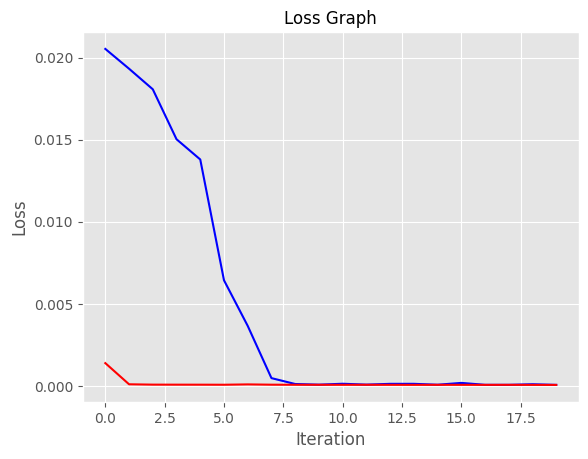

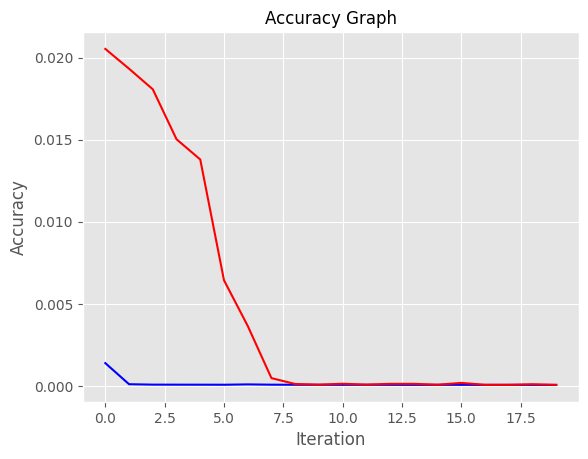

In [14]:
history_post_training  = history.history

train_dice_coefficient_list = history_post_training['dice_coefficient']
test_dice_coefficient_list = history_post_training['val_dice_coefficient']

train_jaccard_list = history_post_training['intersection_over_union']
test_jaccard_list = history_post_training['val_intersection_over_union']

train_lost_list = history_post_training['loss']
test_loss_list = history_post_training['val_loss']

plt.figure(1)
plt.plot(test_loss_list, 'b-')
plt.plot(train_lost_list, 'r-')

plt.xlabel('Iteration')
plt.ylabel('Loss')
plt.title('Loss Graph', fontsize = 12)

plt.figure(2)
plt.plot(train_dice_coefficient_list, 'b-')
plt.plot(test_dice_coefficient_list, 'r-')

plt.xlabel('Iteration')
plt.ylabel('Accuracy')
plt.title('Accuracy Graph', fontsize = 12)

plt.show()

# ***Loading previously trained model***

In [23]:
model = load_model('/content/drive/MyDrive/unet.hdf5', custom_objects={'dice_coefficient_loss': dice_coefficient_loss, 'intersection_over_union': intersection_over_union, 'dice_coefficient': dice_coefficient})

test_gen = train_generator(df_test, BATCH_SIZE, dict(), target_size = (im_height, im_width))

results = model.evaluate(test_gen, steps = len(df_test) / BATCH_SIZE)

print('Test Loss', results[0])
print('Test IoU', results[1])
print('Test Dice Coefficient', results[2])

Found 279 validated image filenames.
Found 279 validated image filenames.
8/8 [==============================] - 4s 452ms/step - loss: 7.0753e-05 - binary_accuracy: 0.2345 - intersection_over_union: 0.8252 - dice_coefficient: 7.1380e-05
Test Loss 7.075251778587699e-05
Test IoU 0.23454377055168152
Test Dice Coefficient 0.8251906633377075


# ***Plotting Predicted Masks Segmentation results from Test Image Set***

1/1 [==============================] - 0s 32ms/step


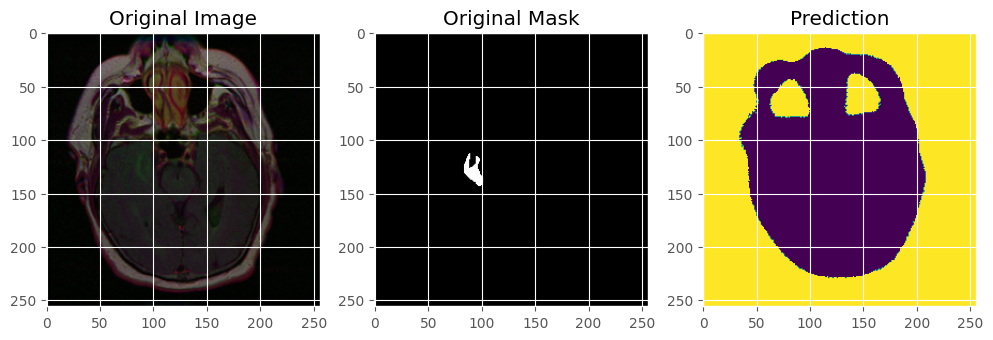

1/1 [==============================] - 0s 58ms/step


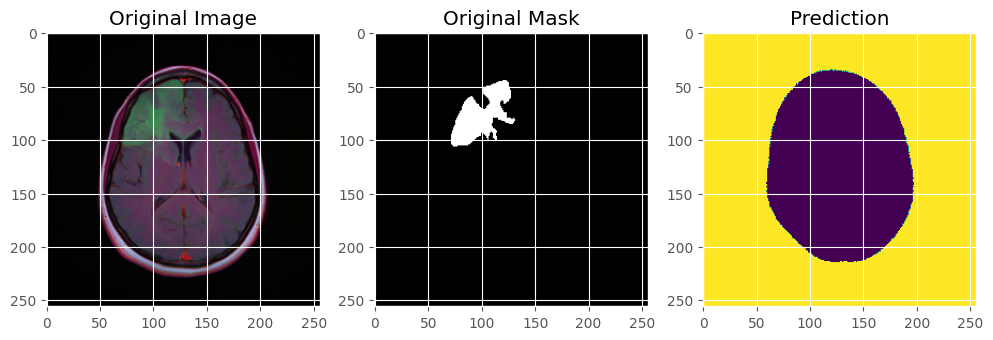

1/1 [==============================] - 0s 19ms/step


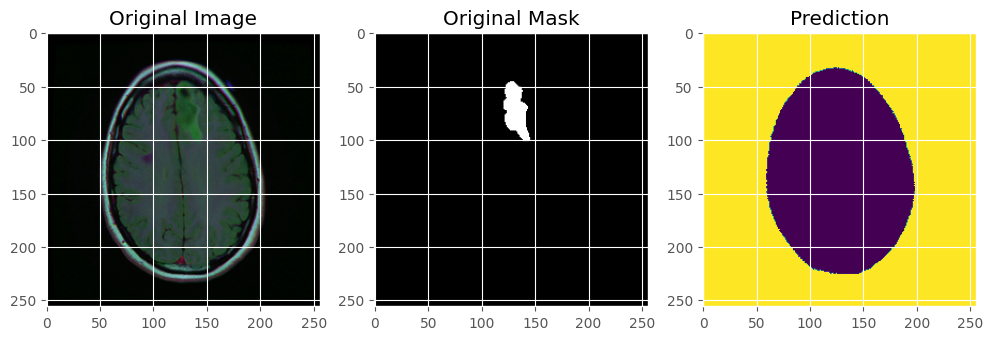

1/1 [==============================] - 0s 19ms/step


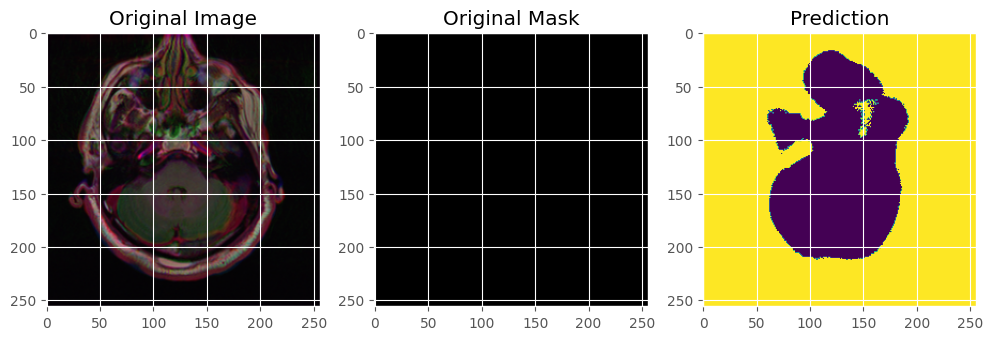

1/1 [==============================] - 0s 19ms/step


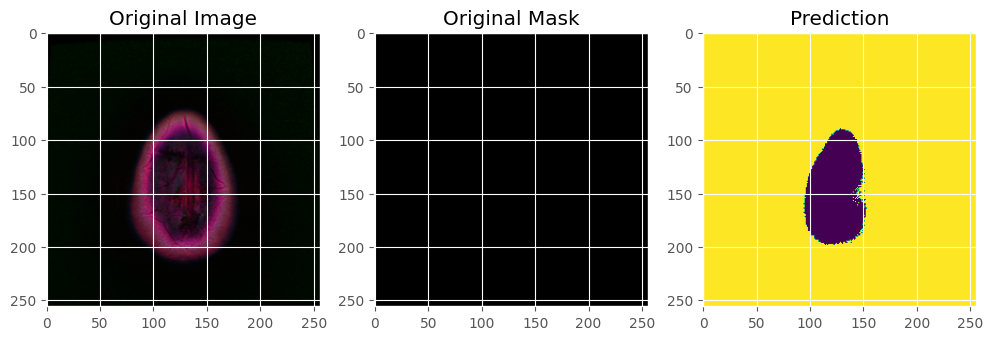

1/1 [==============================] - 0s 19ms/step


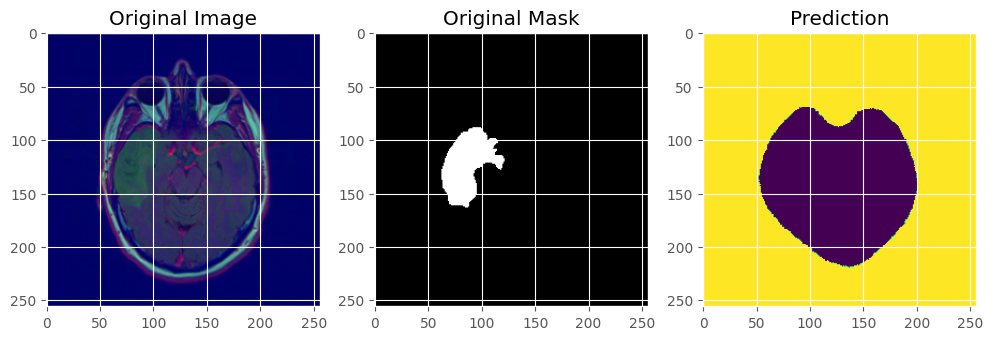

1/1 [==============================] - 0s 20ms/step


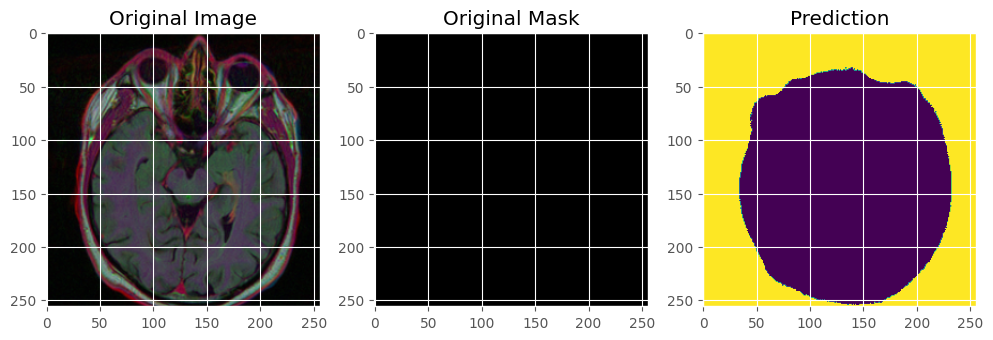

1/1 [==============================] - 0s 21ms/step


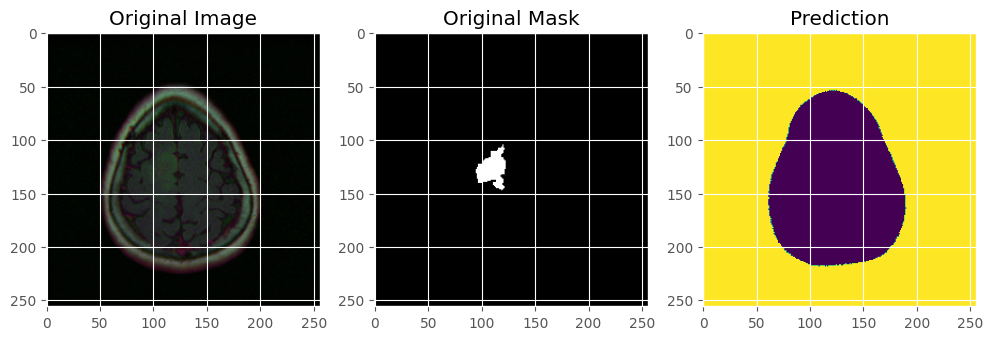

1/1 [==============================] - 0s 30ms/step


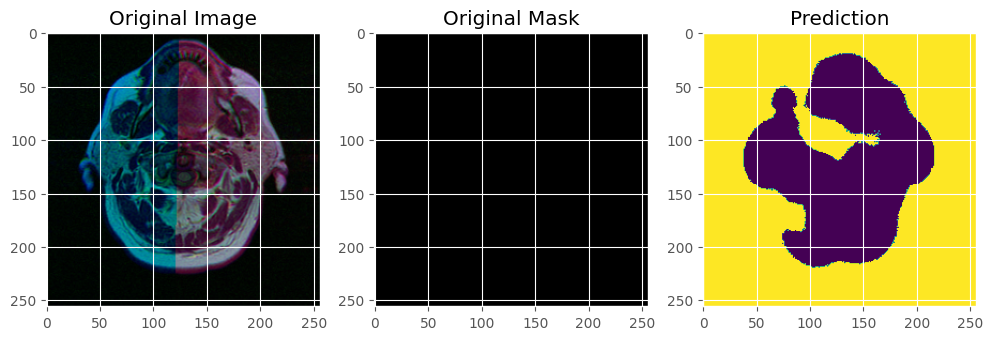

1/1 [==============================] - 0s 21ms/step


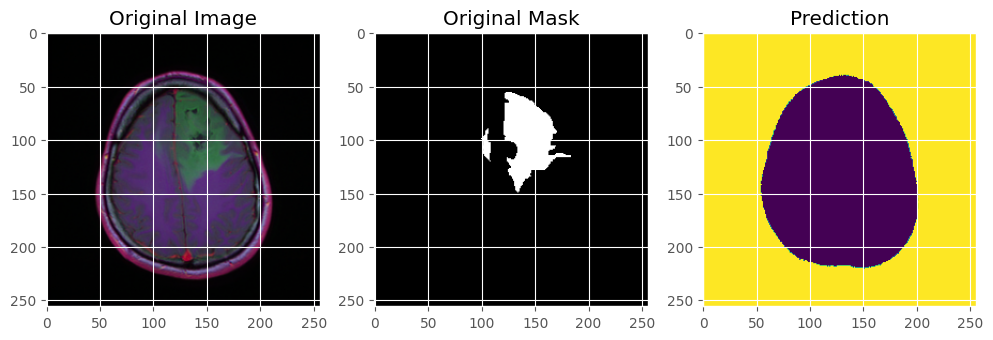

1/1 [==============================] - 0s 28ms/step


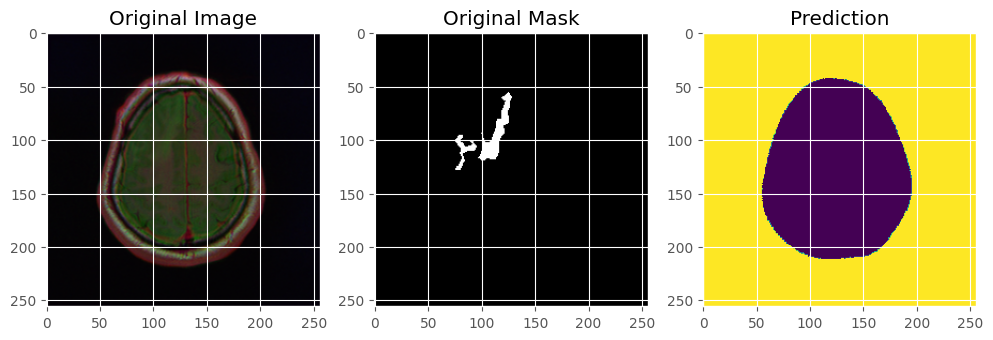

1/1 [==============================] - 0s 20ms/step


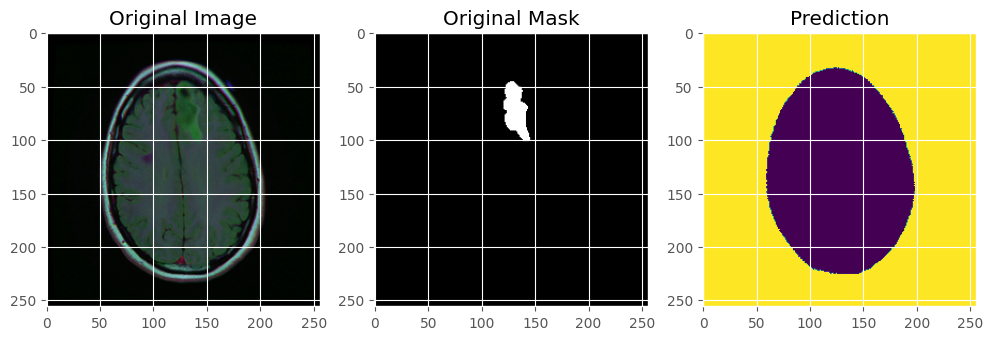

1/1 [==============================] - 0s 34ms/step


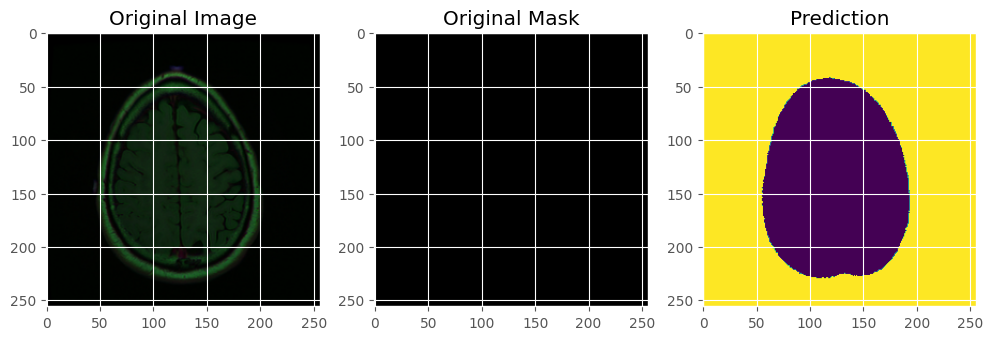

1/1 [==============================] - 0s 30ms/step


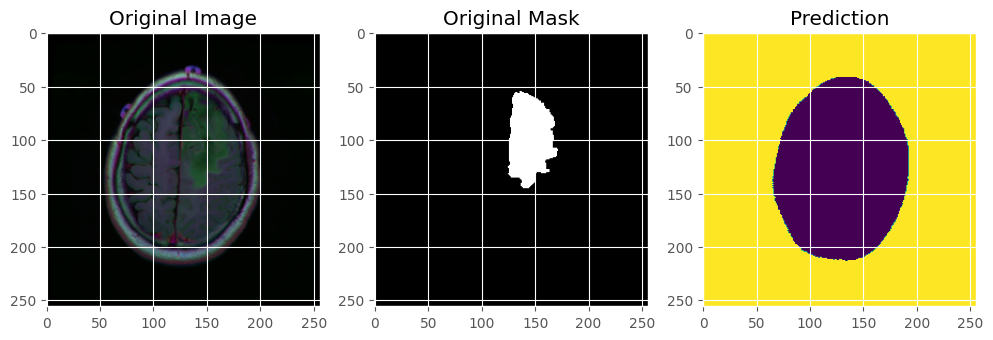

1/1 [==============================] - 0s 27ms/step


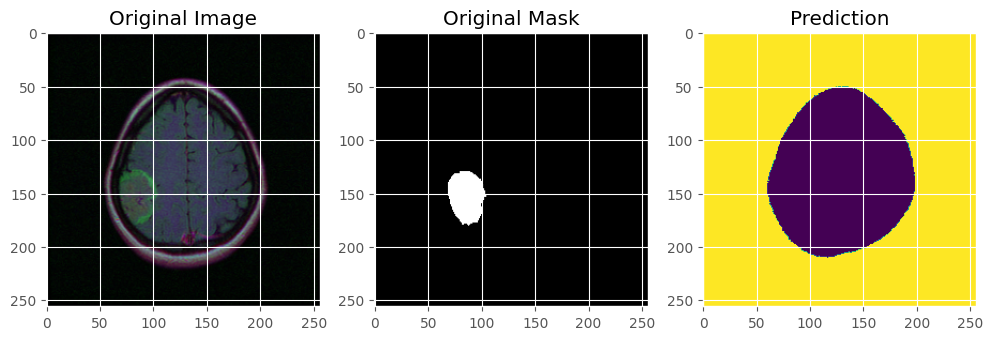

1/1 [==============================] - 0s 27ms/step


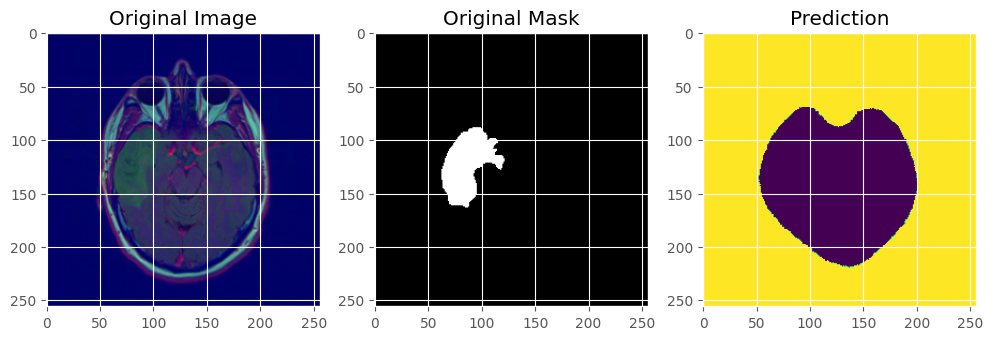

1/1 [==============================] - 0s 29ms/step


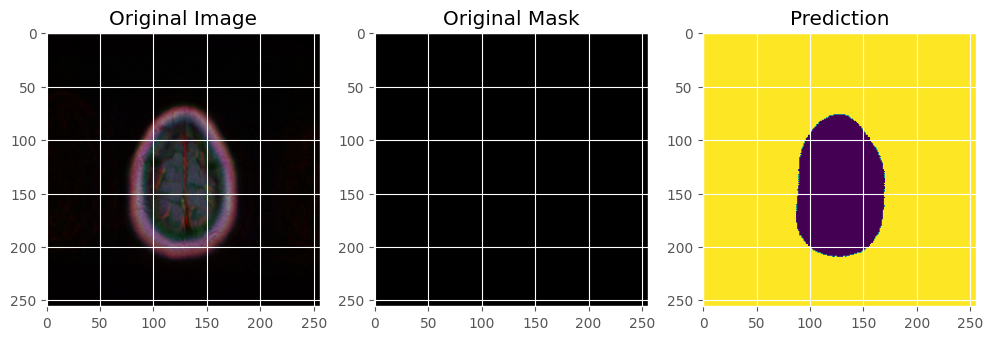

1/1 [==============================] - 0s 27ms/step


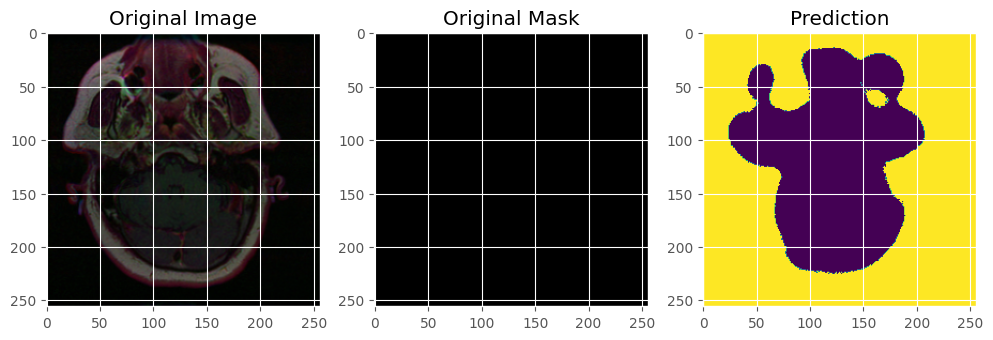

1/1 [==============================] - 0s 25ms/step


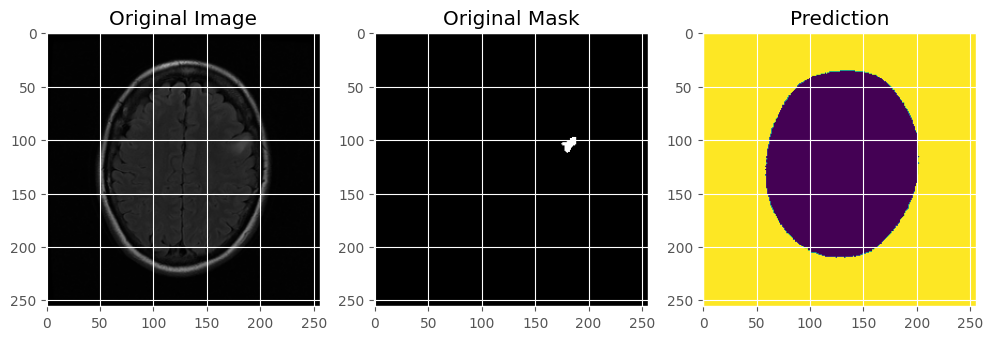

1/1 [==============================] - 0s 20ms/step


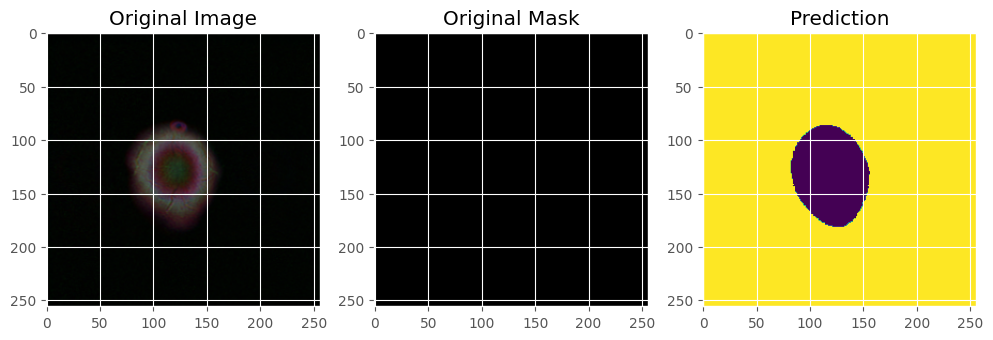

1/1 [==============================] - 0s 27ms/step


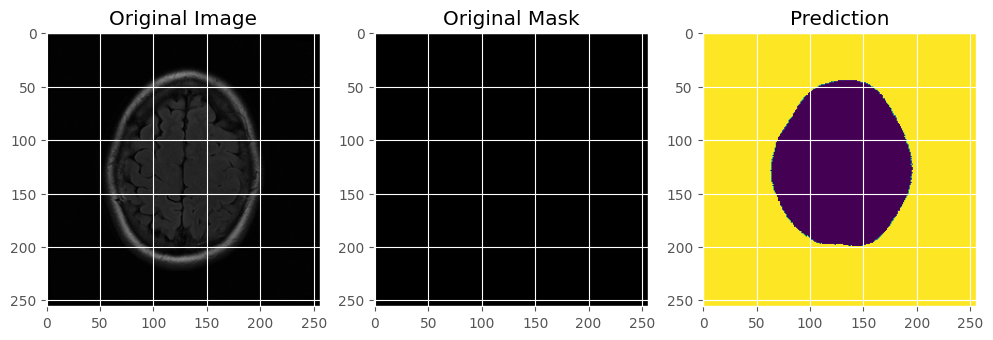

1/1 [==============================] - 0s 25ms/step


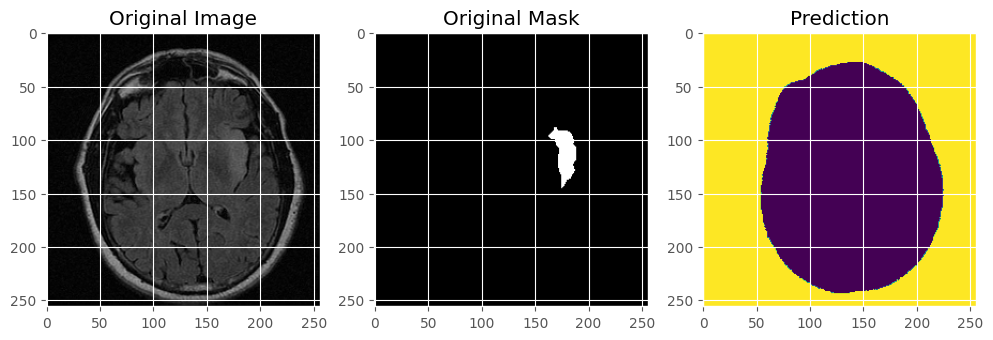

1/1 [==============================] - 0s 31ms/step


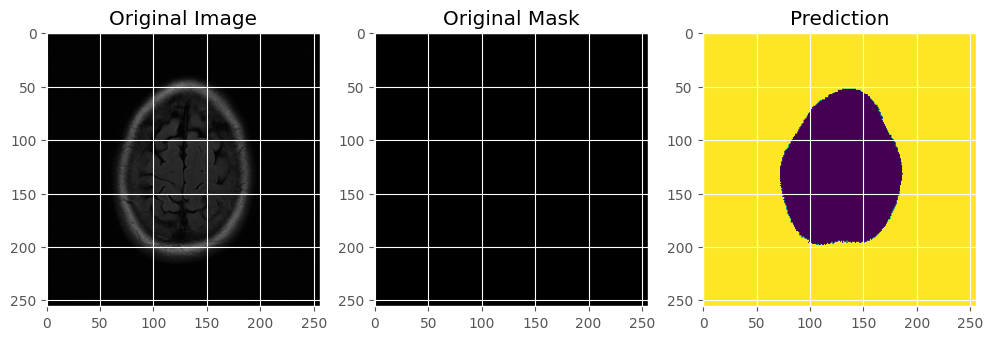

1/1 [==============================] - 0s 22ms/step


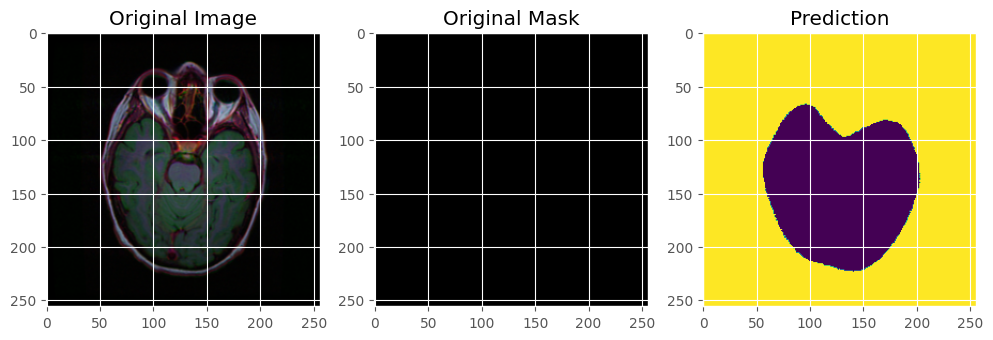

1/1 [==============================] - 0s 36ms/step


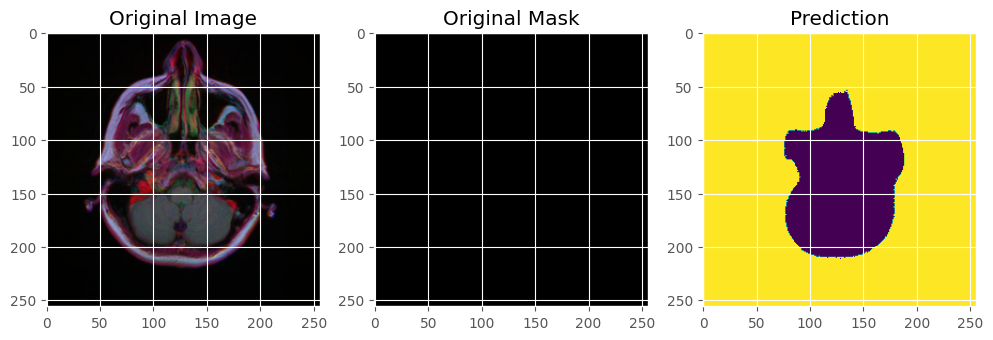

1/1 [==============================] - 0s 29ms/step


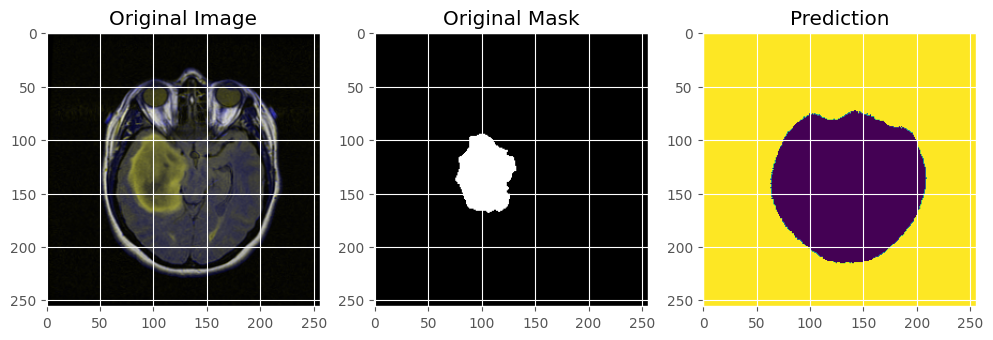

1/1 [==============================] - 0s 31ms/step


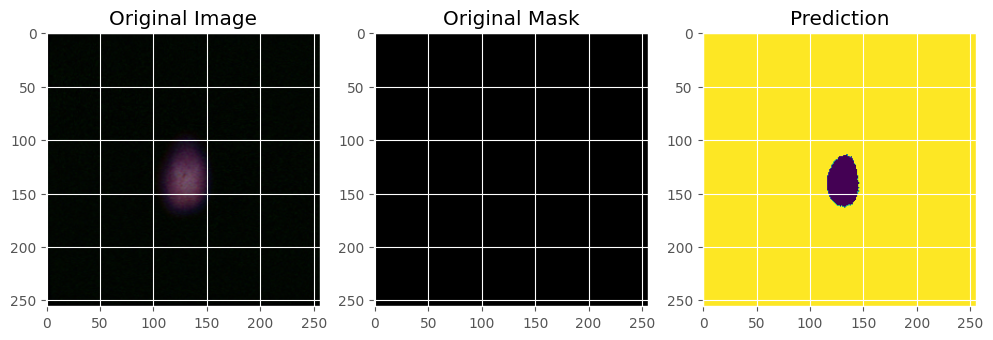

1/1 [==============================] - 0s 28ms/step


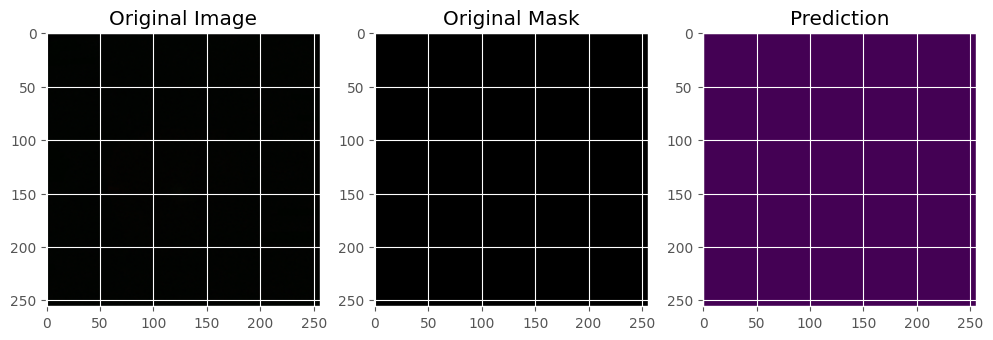

1/1 [==============================] - 0s 24ms/step


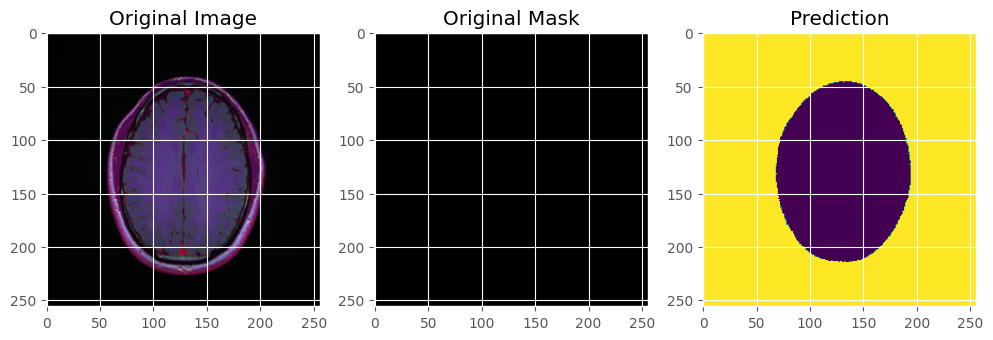

1/1 [==============================] - 0s 35ms/step


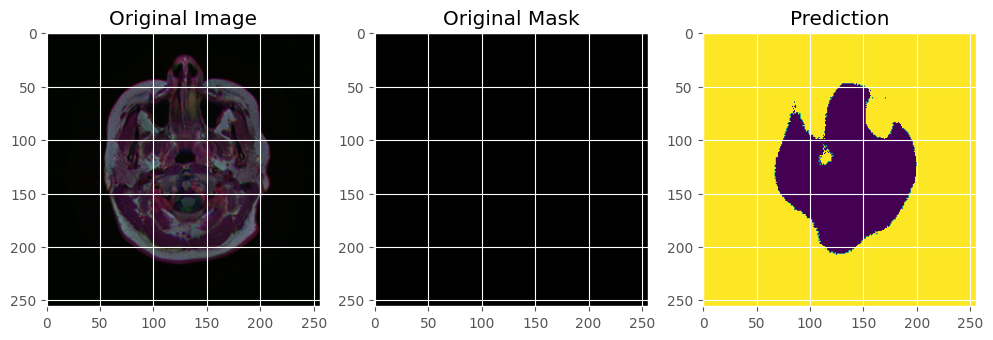

1/1 [==============================] - 0s 31ms/step


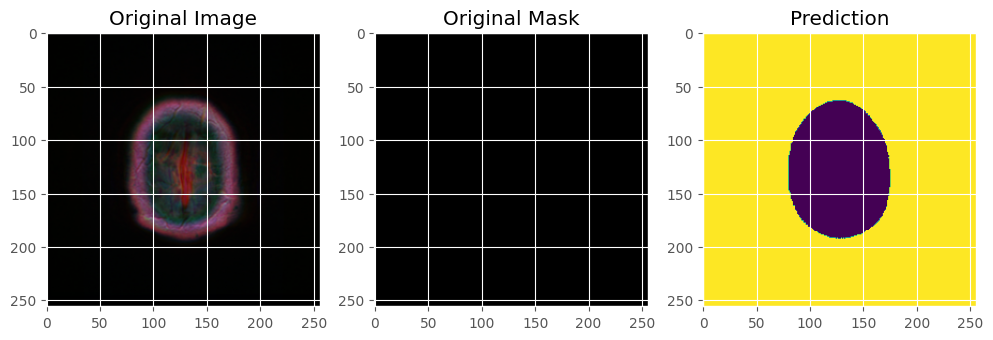

1/1 [==============================] - 0s 30ms/step


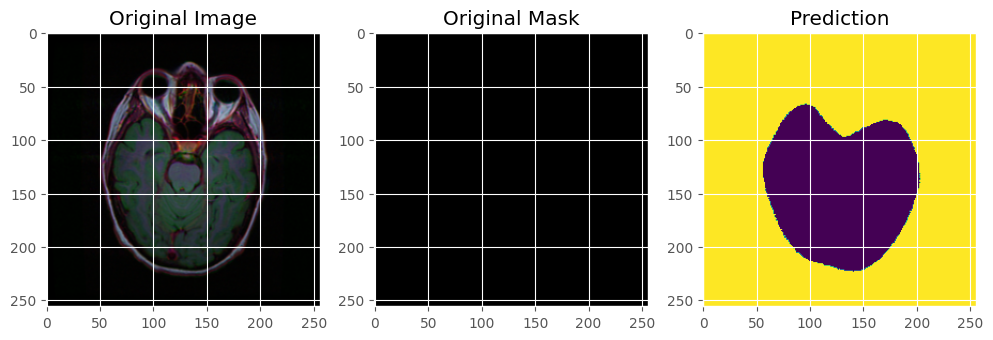

1/1 [==============================] - 0s 51ms/step


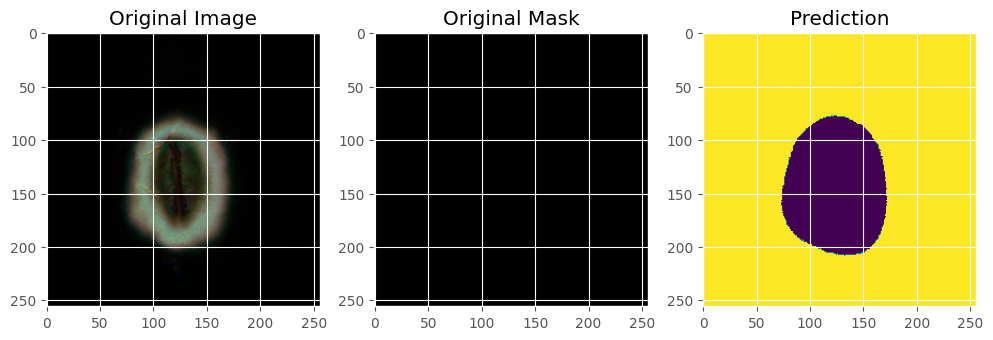

1/1 [==============================] - 0s 35ms/step


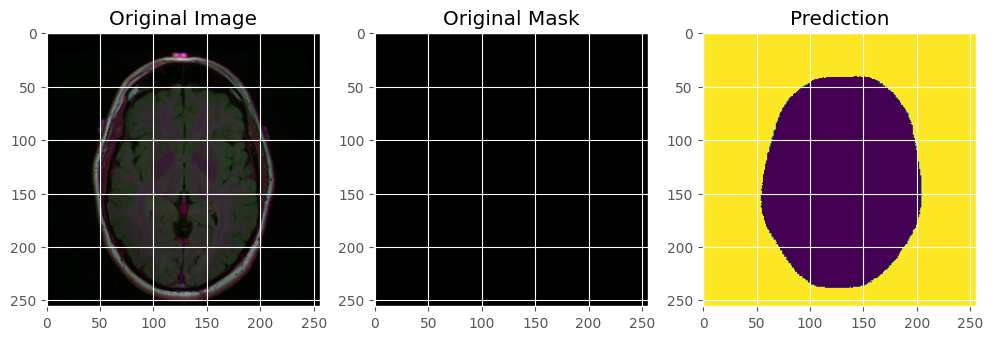

1/1 [==============================] - 0s 35ms/step


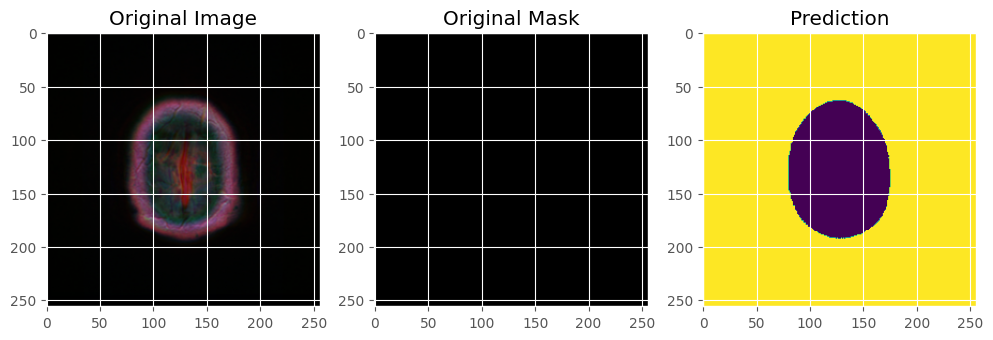

1/1 [==============================] - 0s 33ms/step


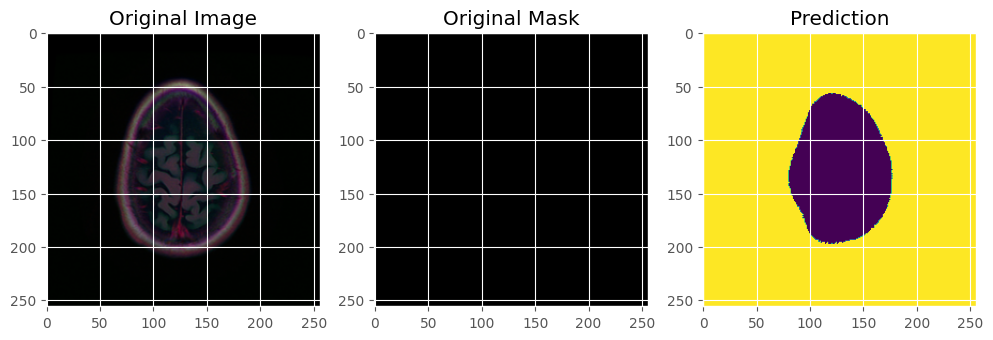

1/1 [==============================] - 0s 33ms/step


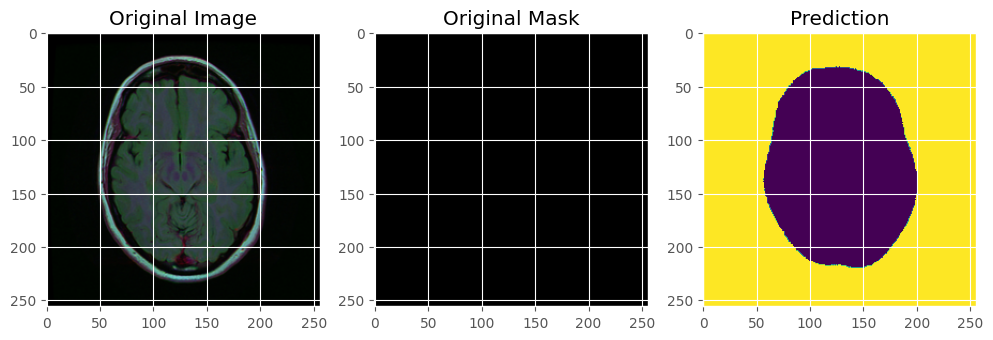

1/1 [==============================] - 0s 31ms/step


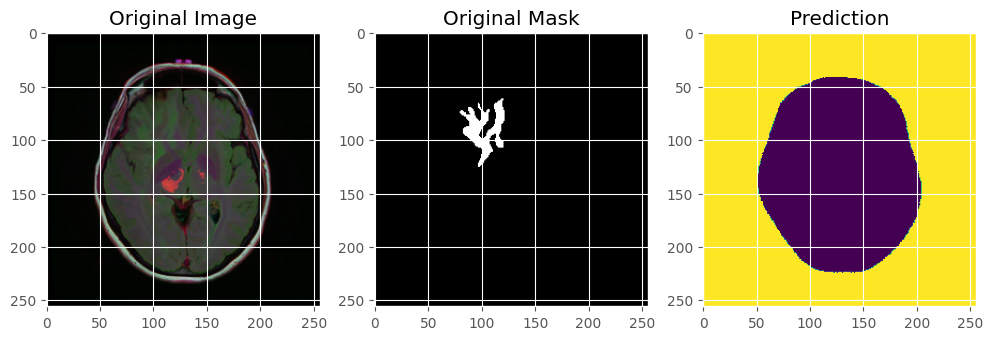

1/1 [==============================] - 0s 36ms/step


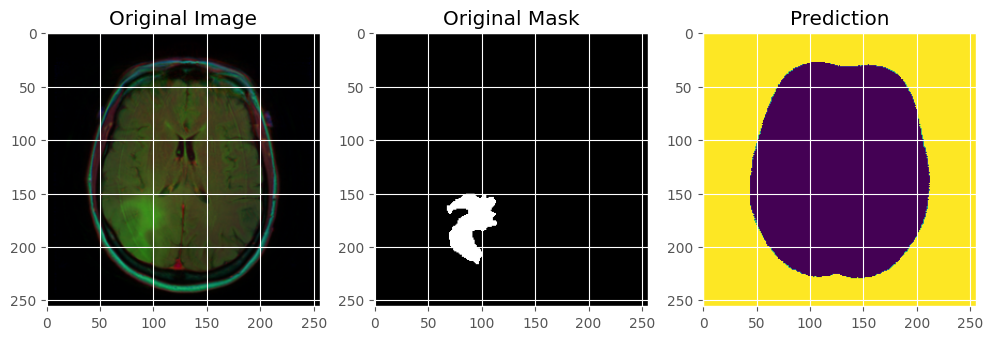

1/1 [==============================] - 0s 29ms/step


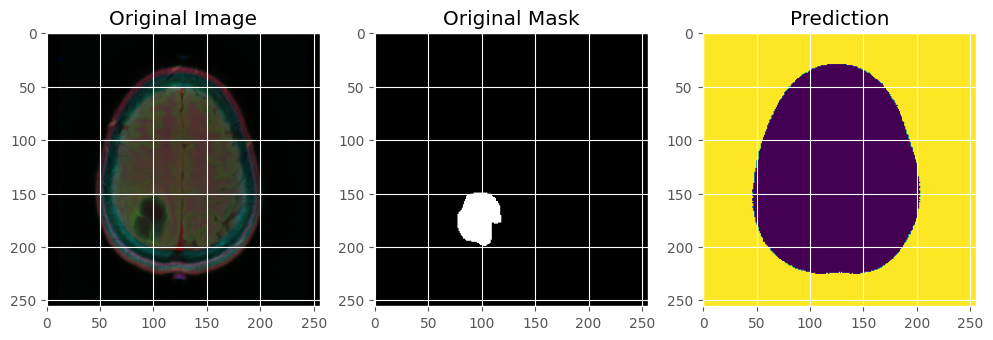

1/1 [==============================] - 0s 41ms/step


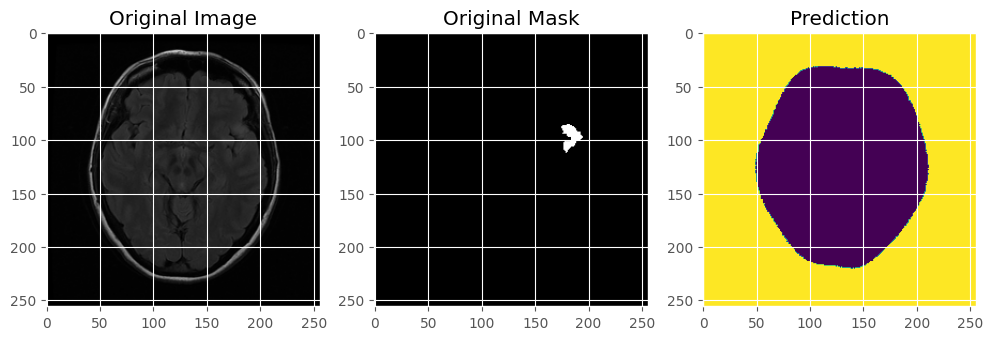

1/1 [==============================] - 0s 35ms/step


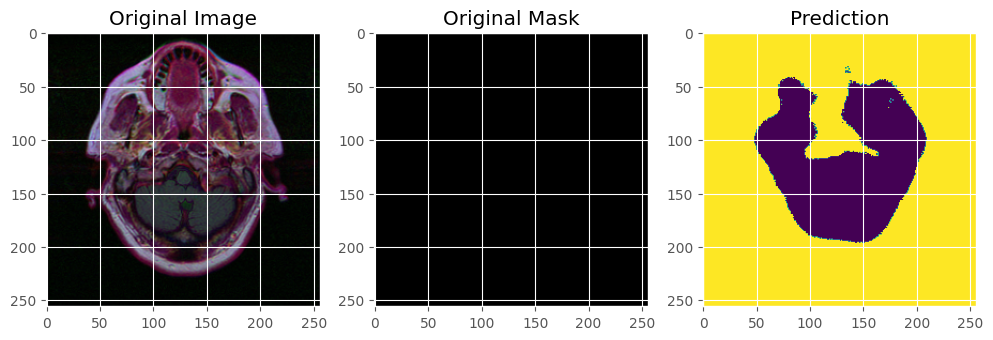

1/1 [==============================] - 0s 28ms/step


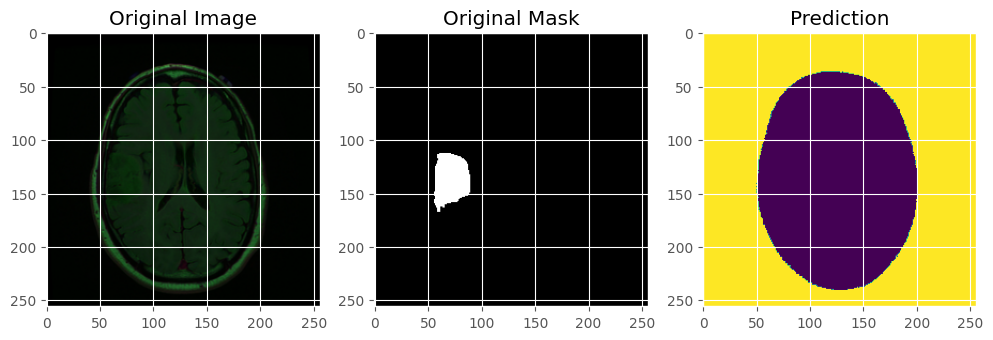

1/1 [==============================] - 0s 30ms/step


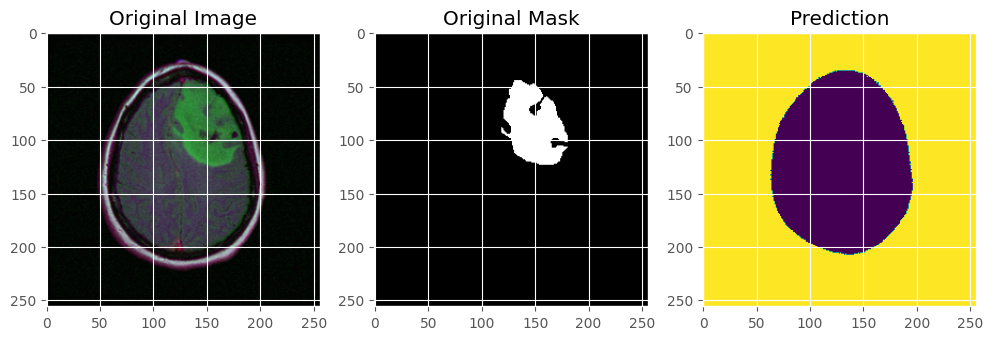

1/1 [==============================] - 0s 35ms/step


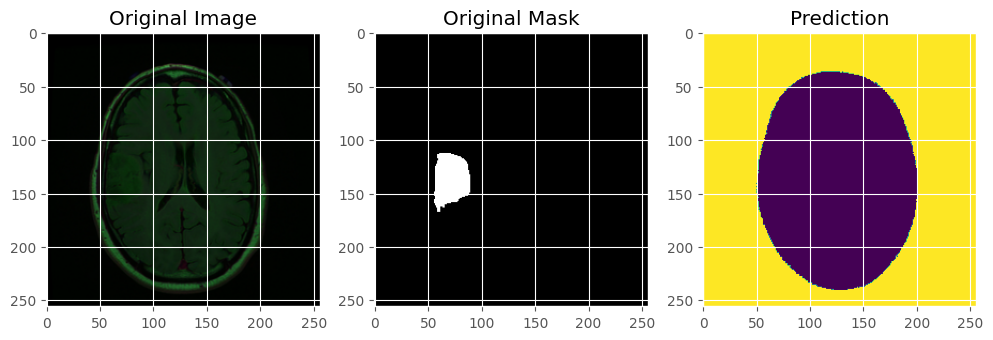

1/1 [==============================] - 0s 40ms/step


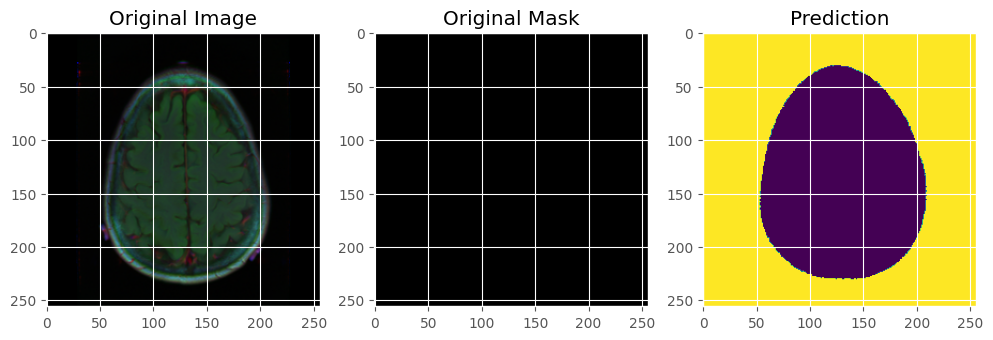

1/1 [==============================] - 0s 26ms/step


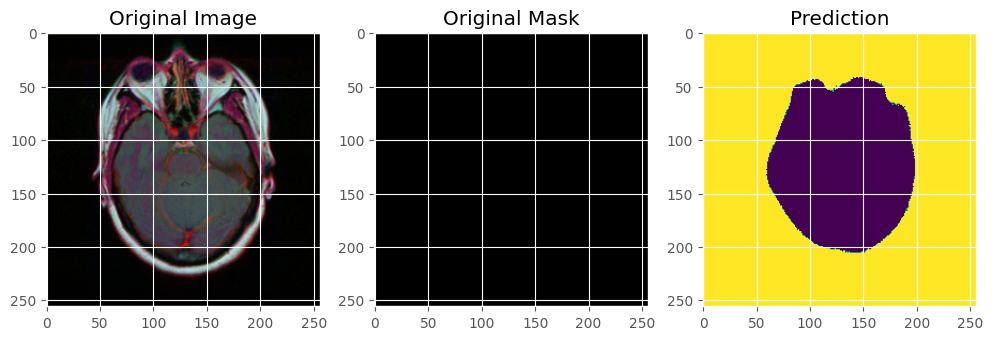

1/1 [==============================] - 0s 26ms/step


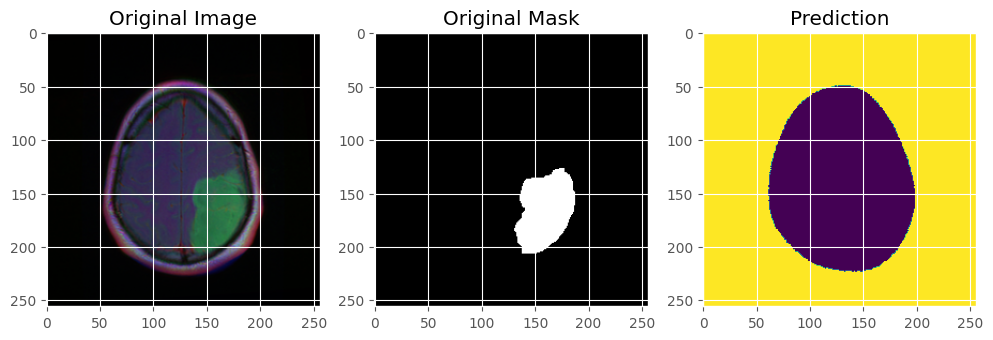

1/1 [==============================] - 0s 42ms/step


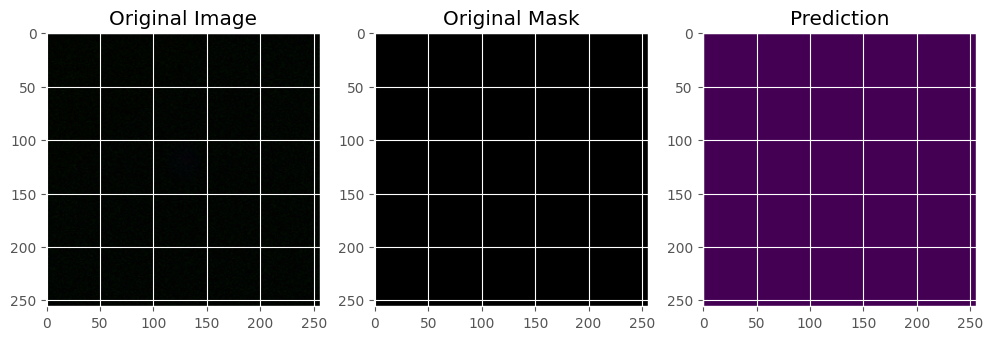

1/1 [==============================] - 0s 25ms/step


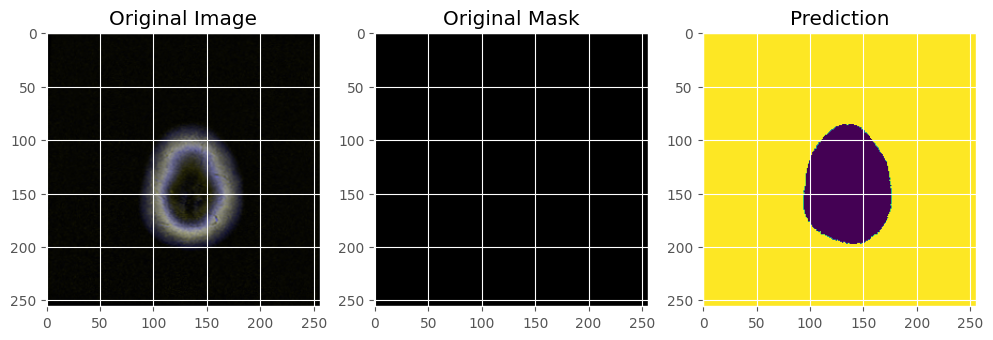

1/1 [==============================] - 0s 28ms/step


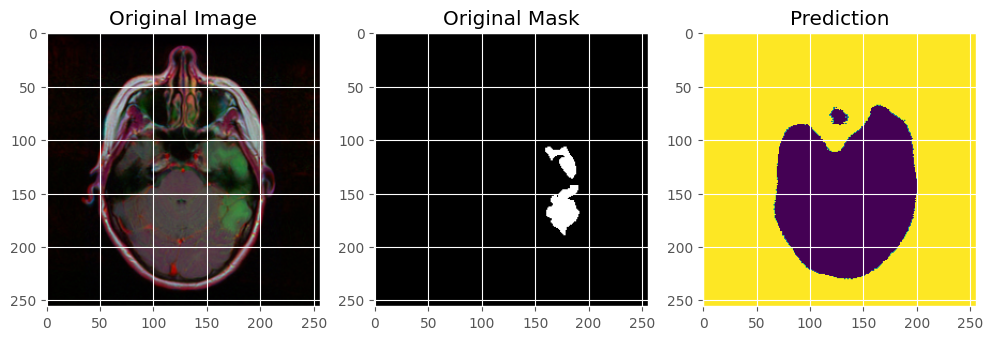

1/1 [==============================] - 0s 36ms/step


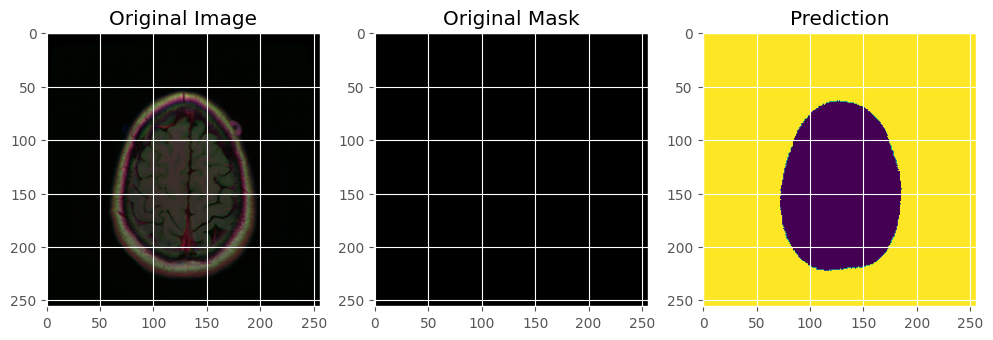

1/1 [==============================] - 0s 47ms/step


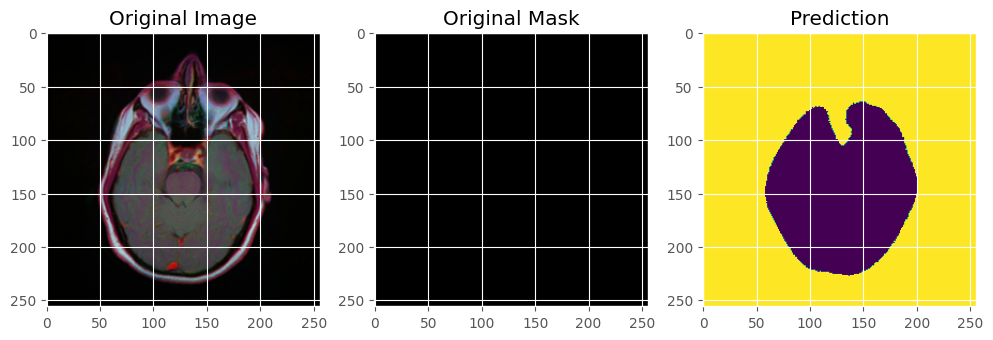

1/1 [==============================] - 0s 44ms/step


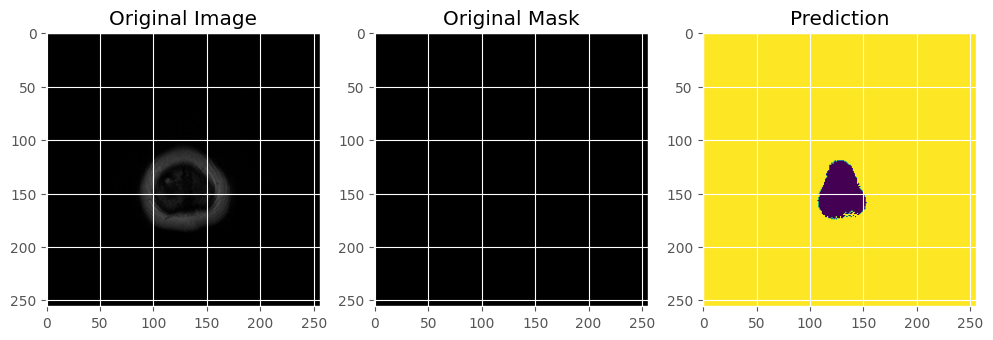

1/1 [==============================] - 0s 66ms/step


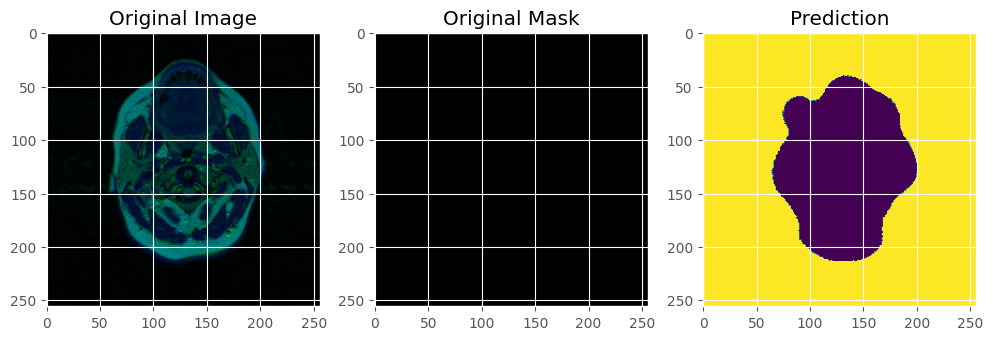

1/1 [==============================] - 0s 55ms/step


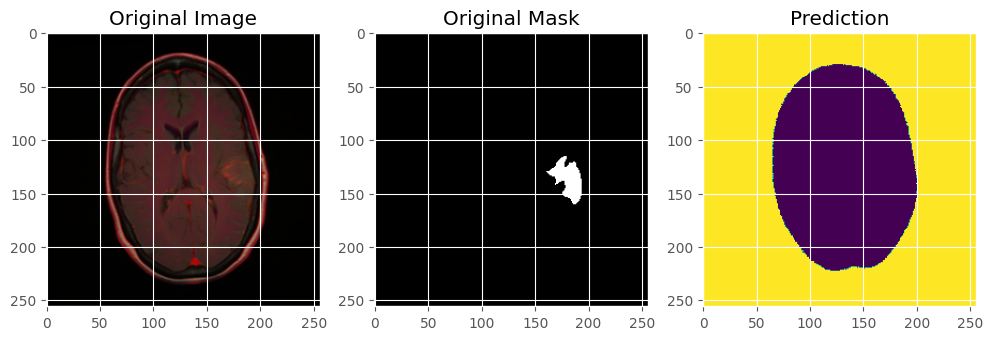

1/1 [==============================] - 0s 27ms/step


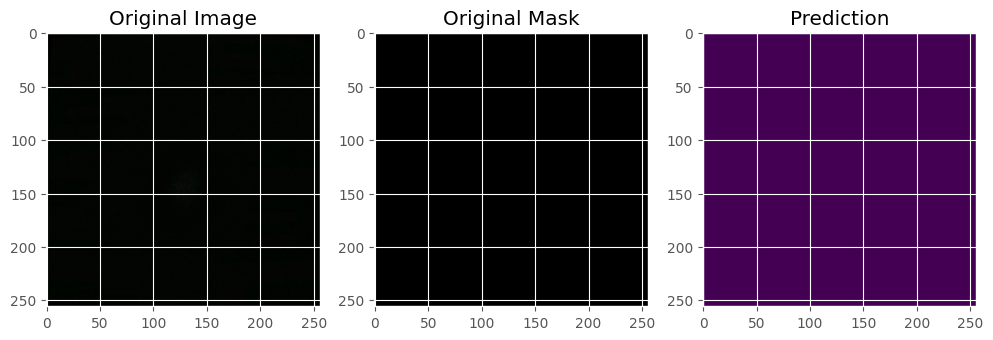

1/1 [==============================] - 0s 26ms/step


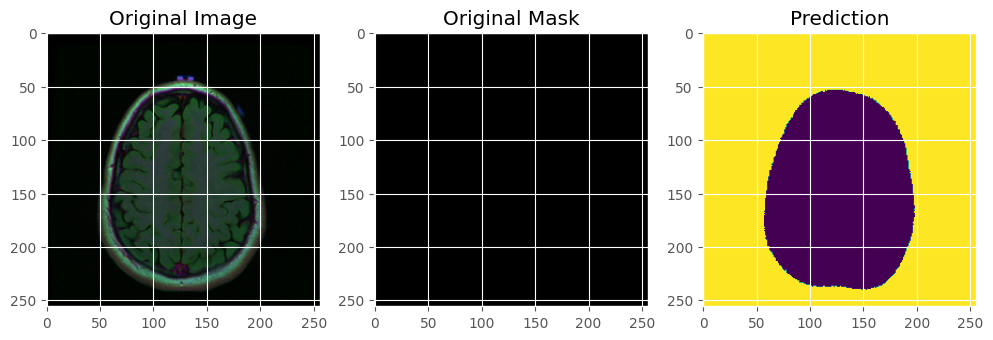

1/1 [==============================] - 0s 29ms/step


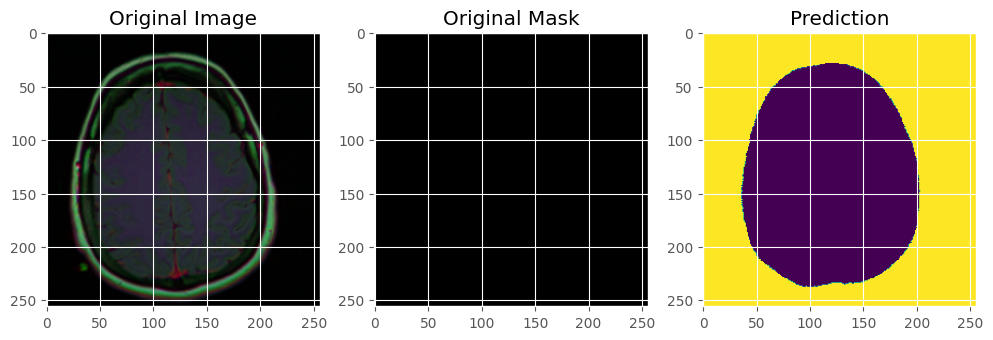

1/1 [==============================] - 0s 26ms/step


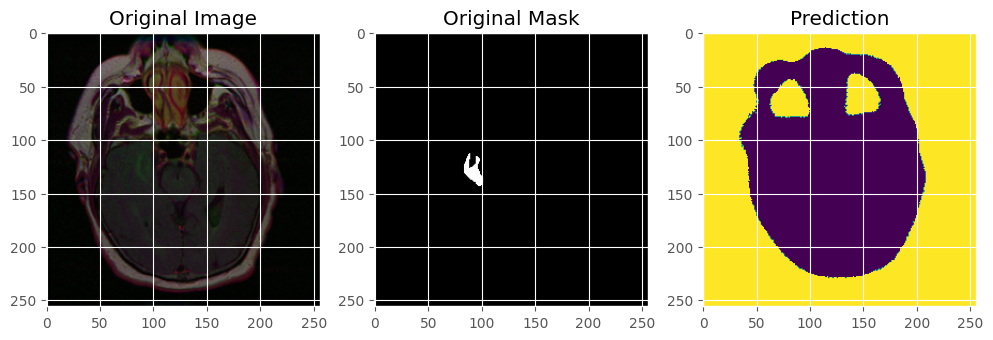

1/1 [==============================] - 0s 27ms/step


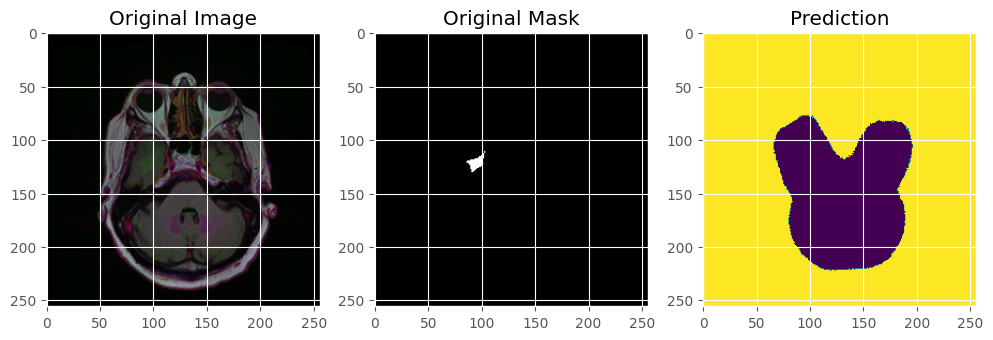

1/1 [==============================] - 0s 30ms/step


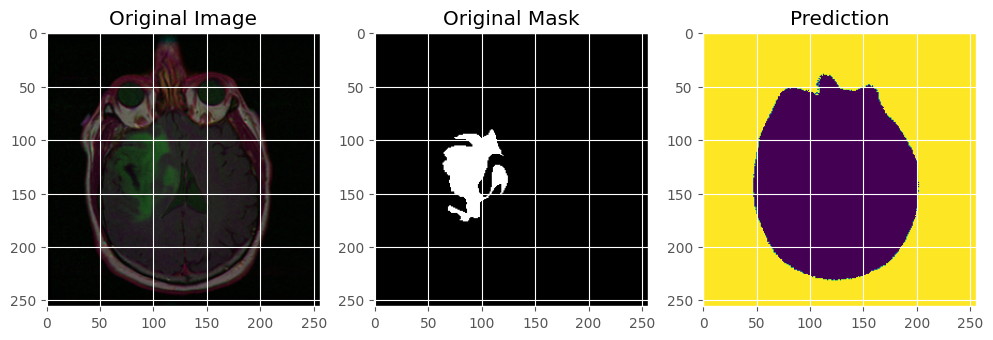

1/1 [==============================] - 0s 27ms/step


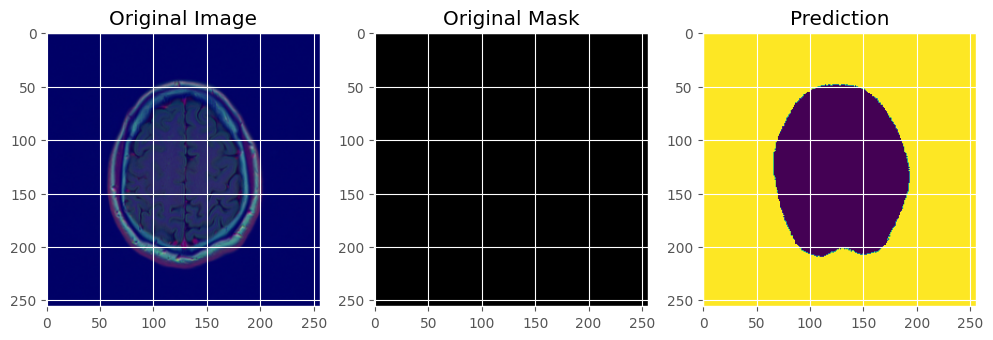

1/1 [==============================] - 0s 26ms/step


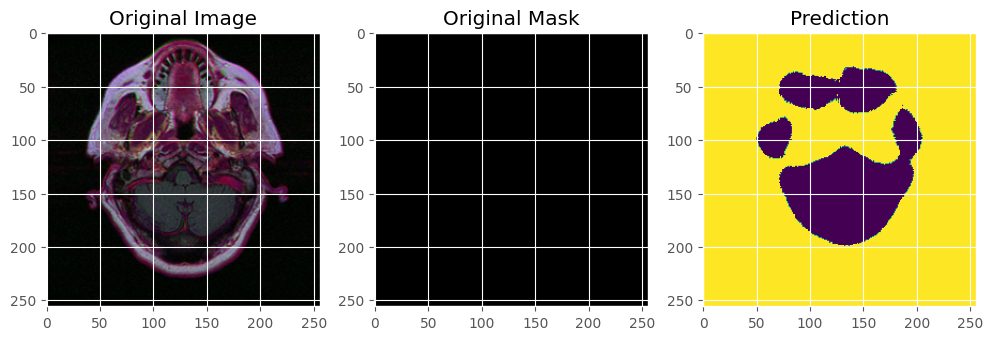

1/1 [==============================] - 0s 34ms/step


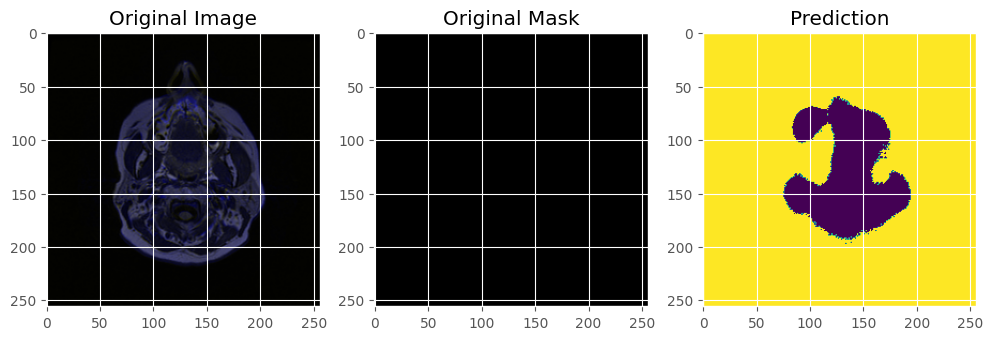

1/1 [==============================] - 0s 29ms/step


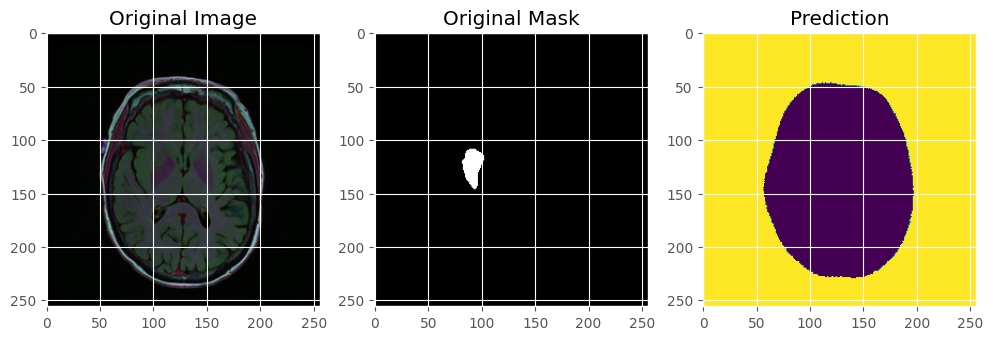

1/1 [==============================] - 0s 31ms/step


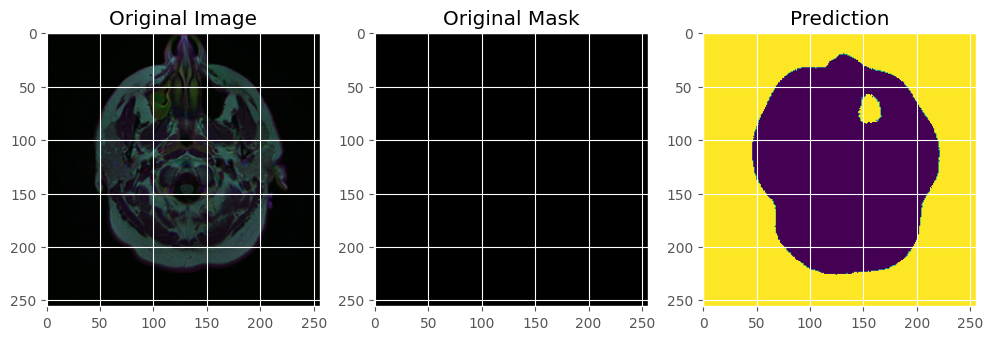

1/1 [==============================] - 0s 29ms/step


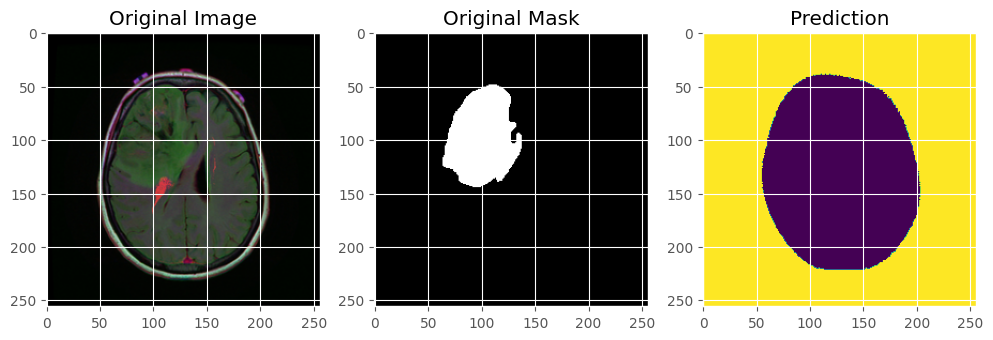

1/1 [==============================] - 0s 33ms/step


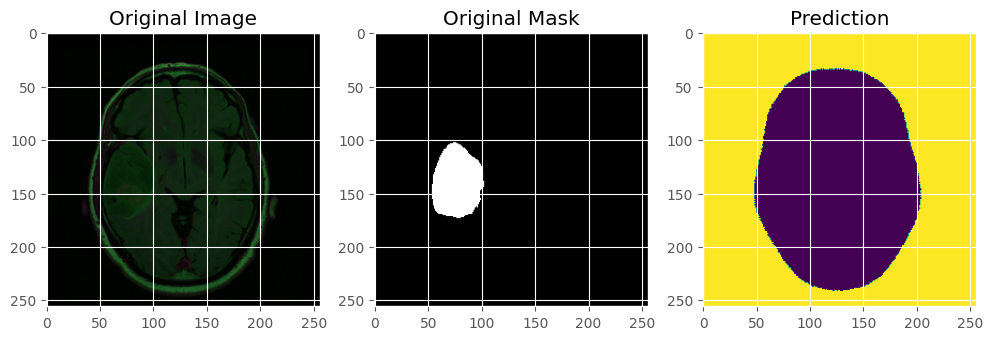

1/1 [==============================] - 0s 27ms/step


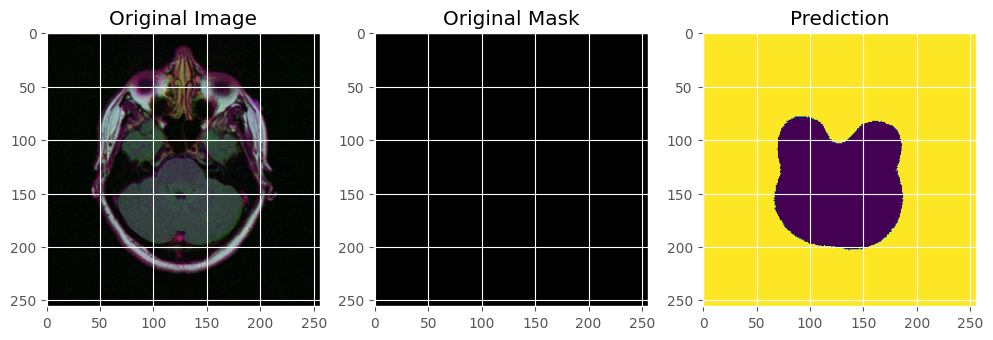

1/1 [==============================] - 0s 27ms/step


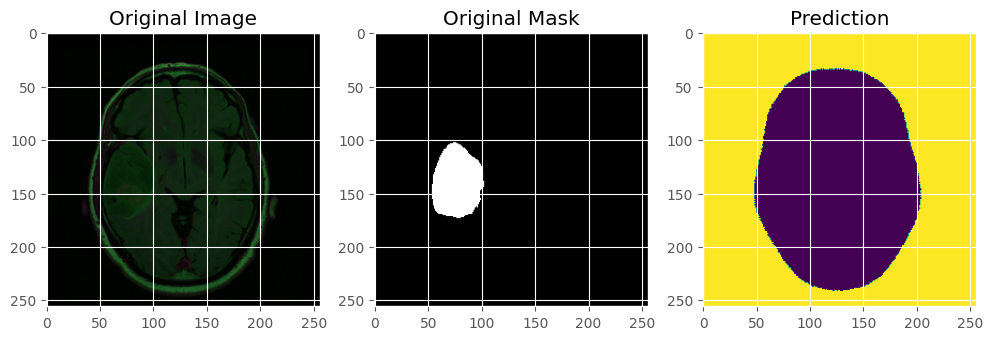

1/1 [==============================] - 0s 30ms/step


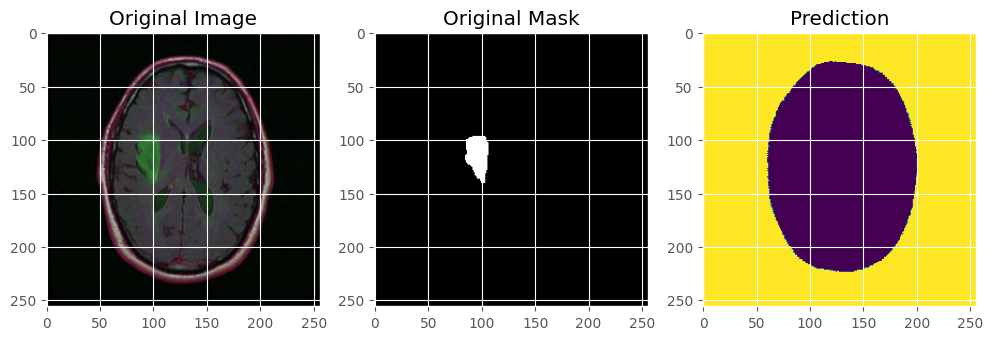

1/1 [==============================] - 0s 27ms/step


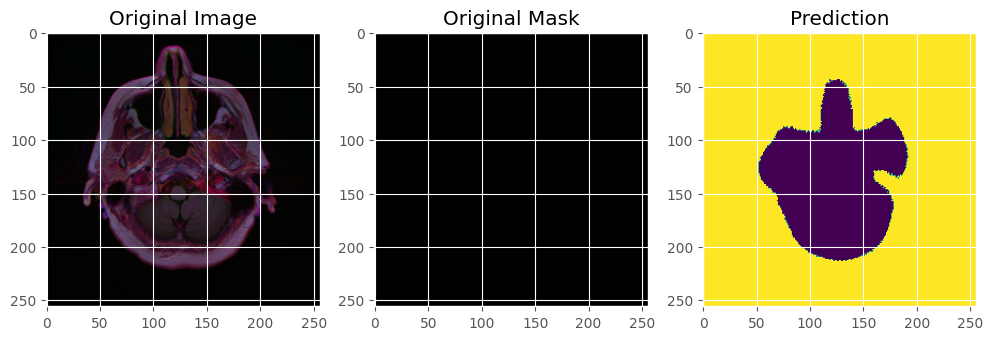

1/1 [==============================] - 0s 27ms/step


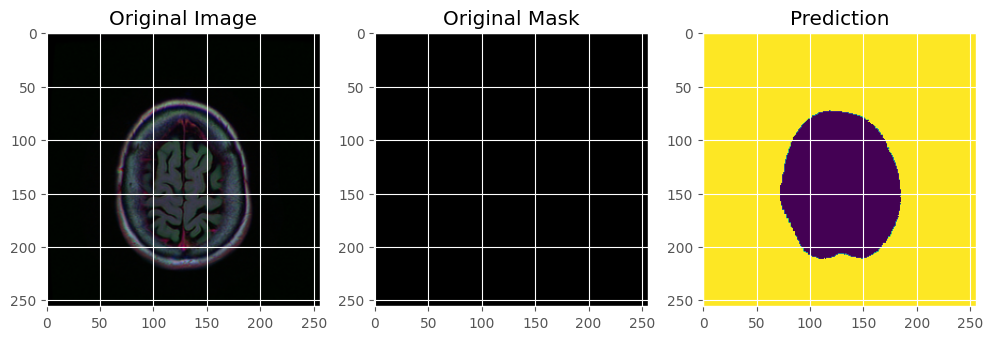

1/1 [==============================] - 0s 28ms/step


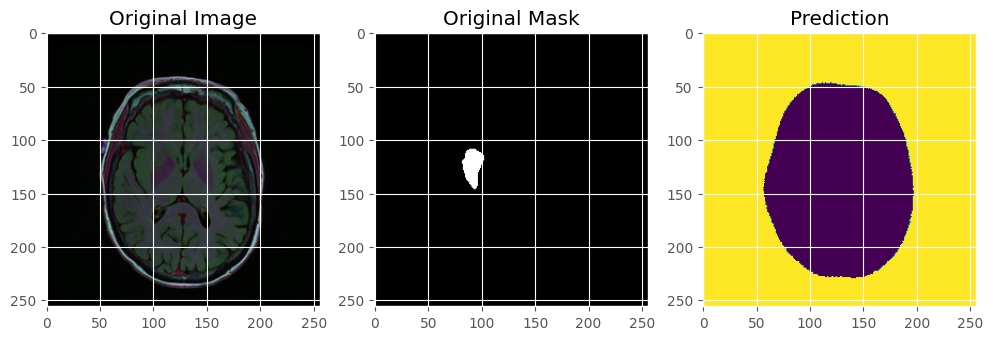

1/1 [==============================] - 0s 46ms/step


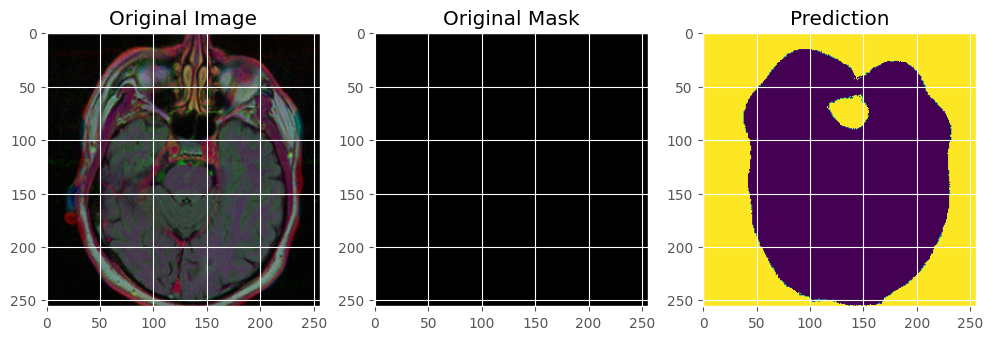

1/1 [==============================] - 0s 28ms/step


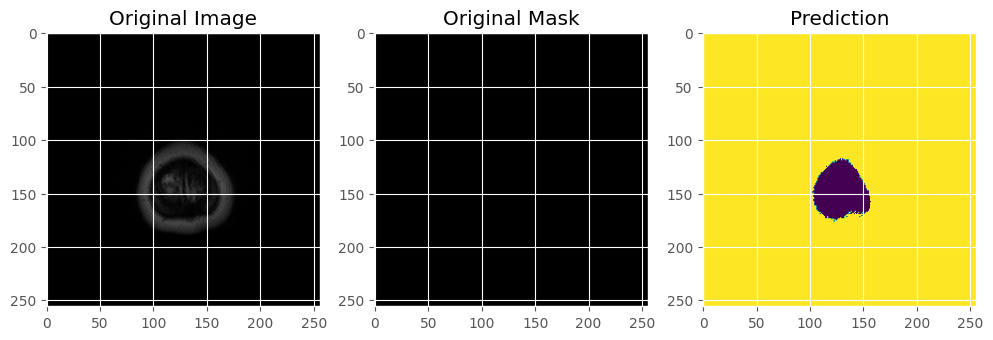

1/1 [==============================] - 0s 27ms/step


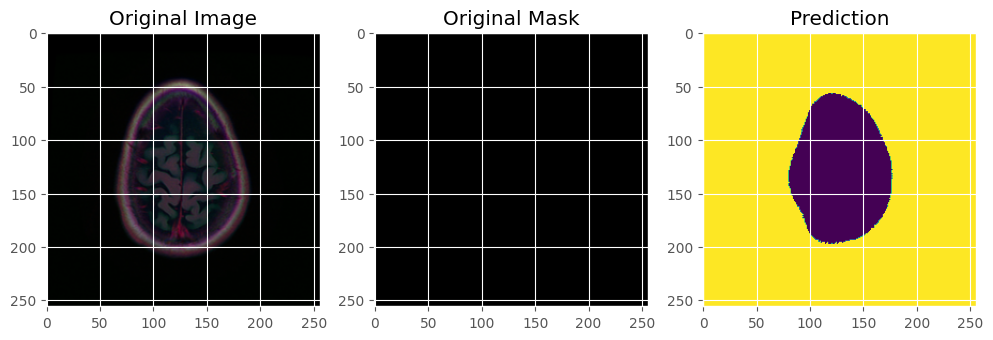

1/1 [==============================] - 0s 34ms/step


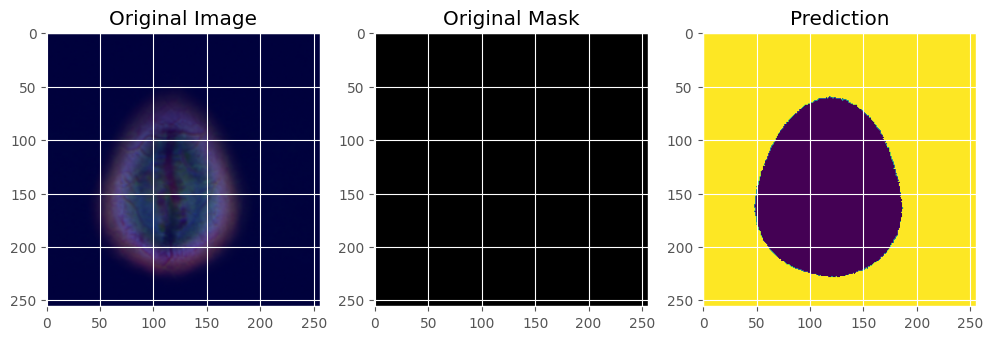

1/1 [==============================] - 0s 39ms/step


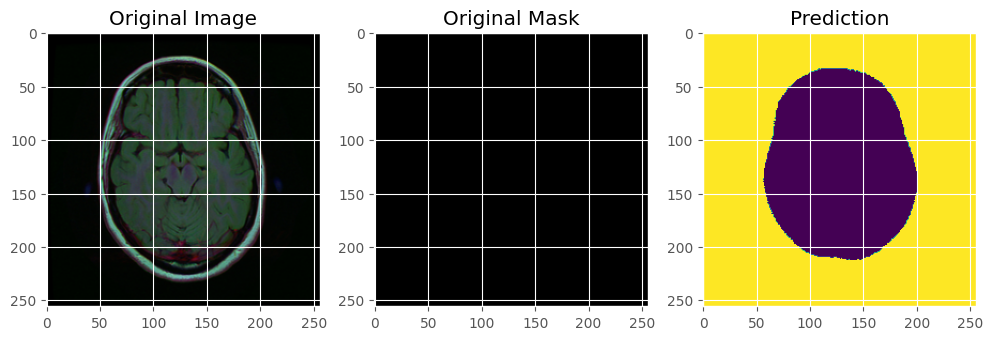

1/1 [==============================] - 0s 32ms/step


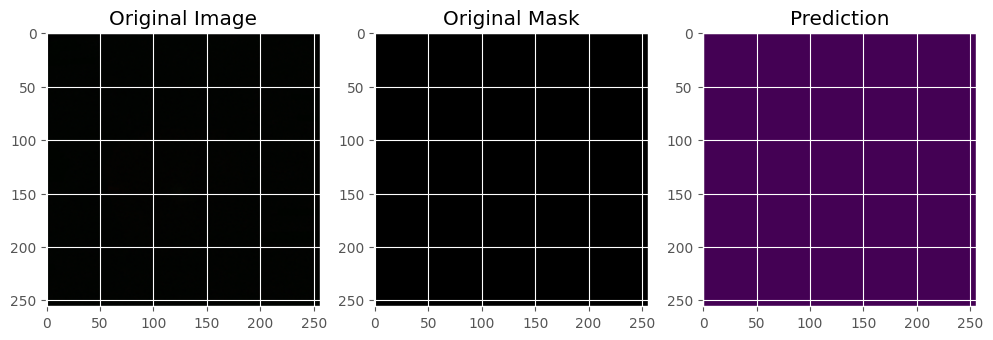

1/1 [==============================] - 0s 37ms/step


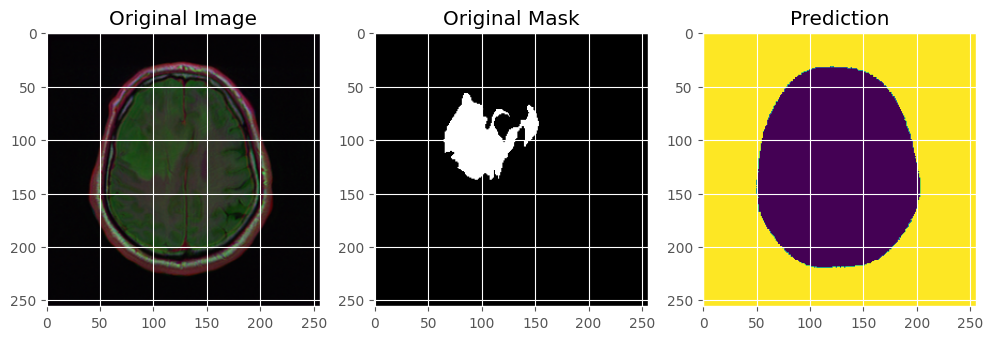

1/1 [==============================] - 0s 29ms/step


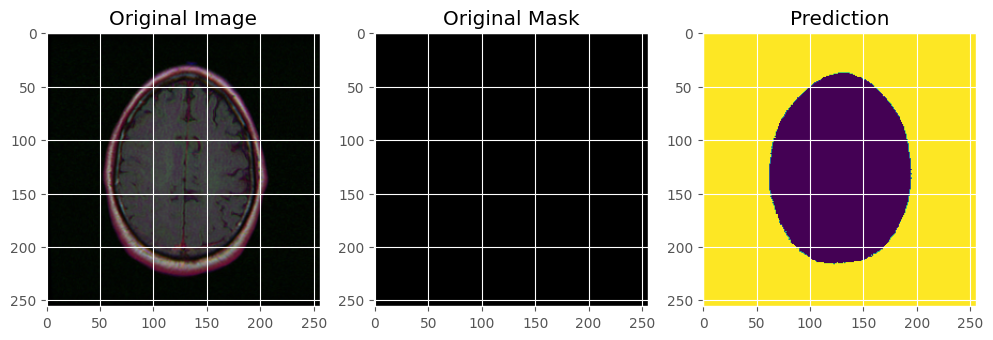

1/1 [==============================] - 0s 26ms/step


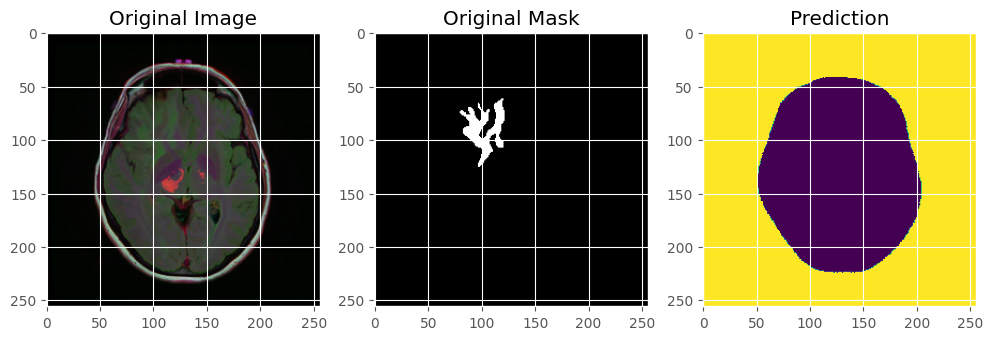

1/1 [==============================] - 0s 32ms/step


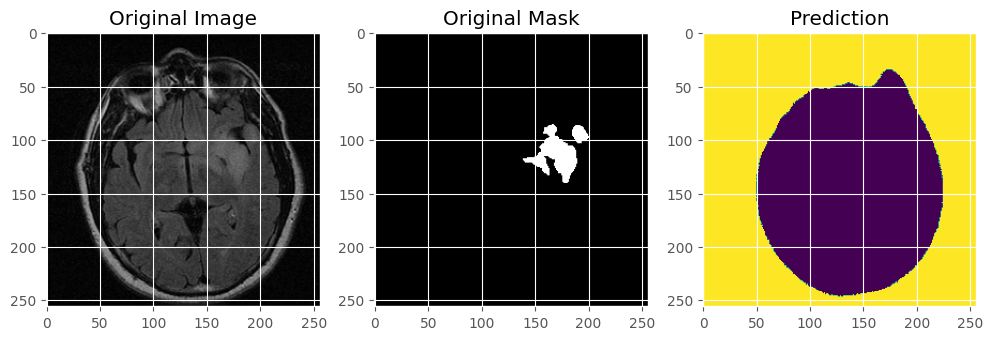

1/1 [==============================] - 0s 26ms/step


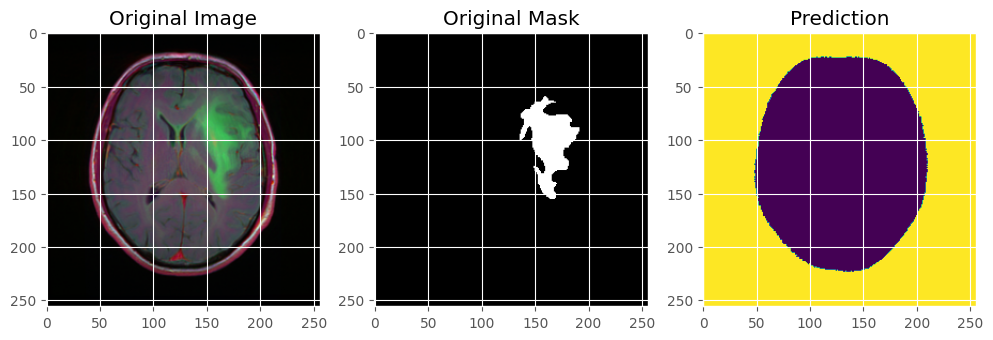

1/1 [==============================] - 0s 35ms/step


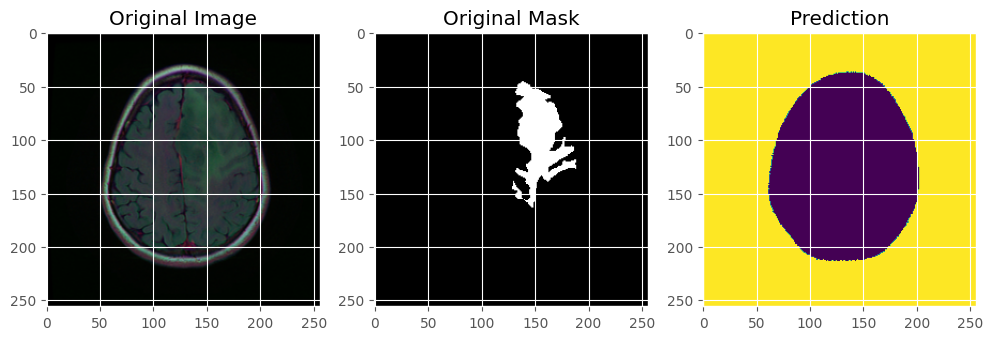

1/1 [==============================] - 0s 37ms/step


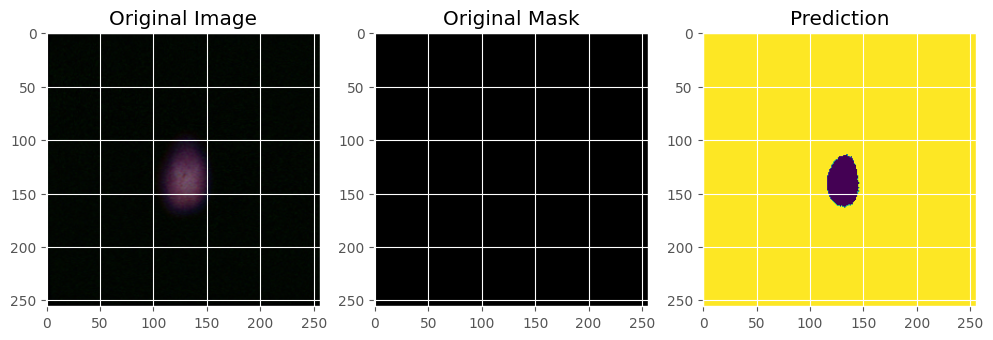

1/1 [==============================] - 0s 27ms/step


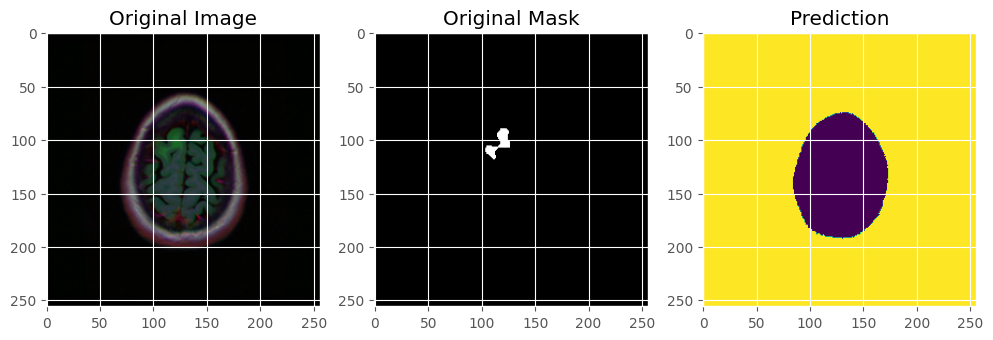

1/1 [==============================] - 0s 34ms/step


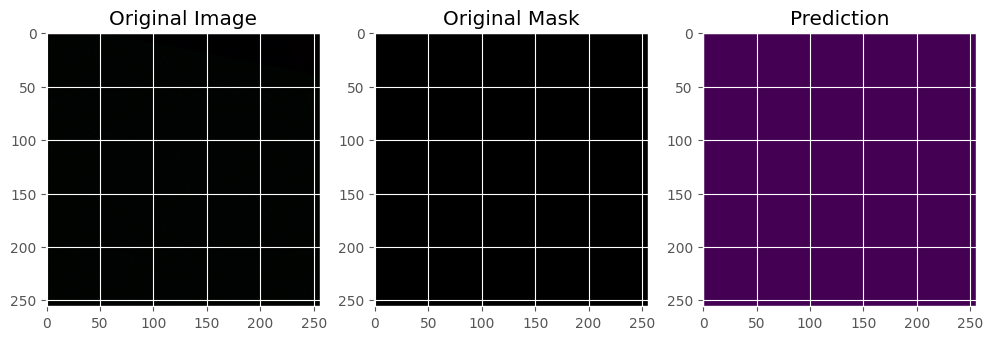

1/1 [==============================] - 0s 40ms/step


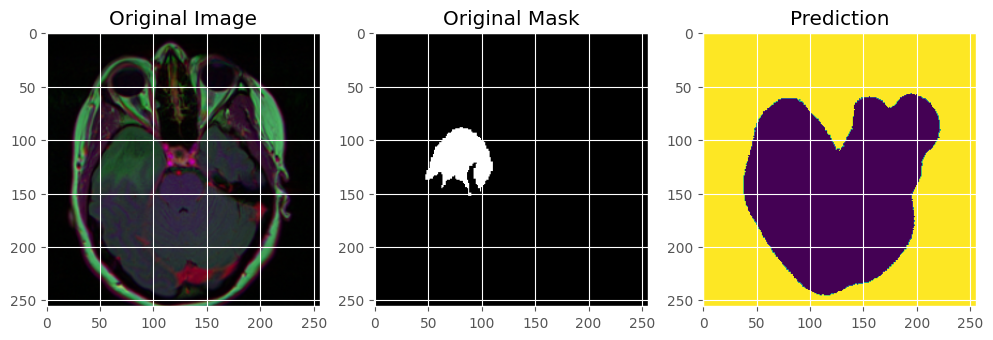

1/1 [==============================] - 0s 33ms/step


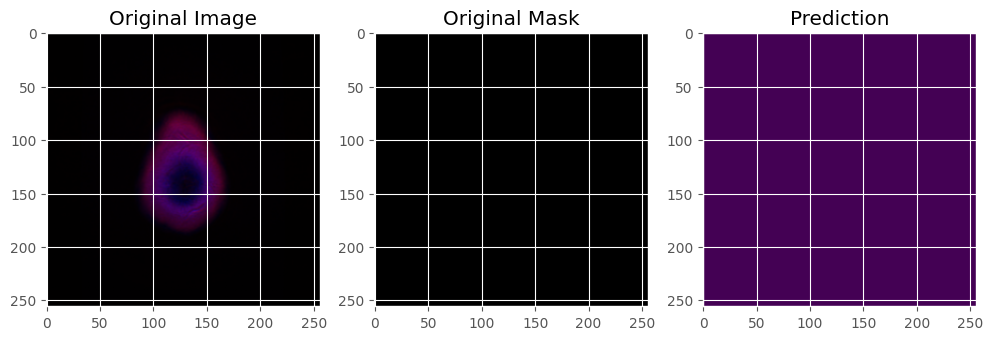

1/1 [==============================] - 0s 33ms/step


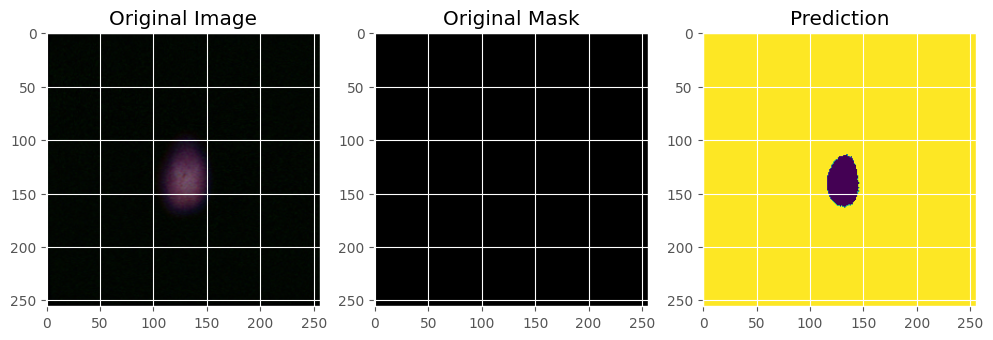

1/1 [==============================] - 0s 63ms/step


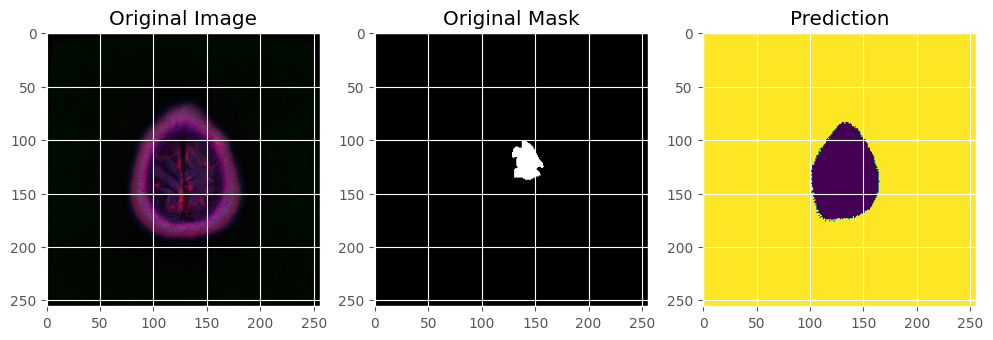

1/1 [==============================] - 0s 58ms/step


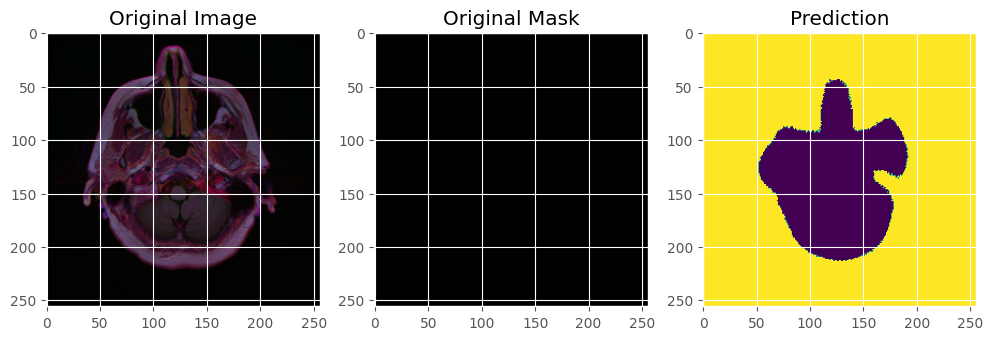

1/1 [==============================] - 0s 35ms/step


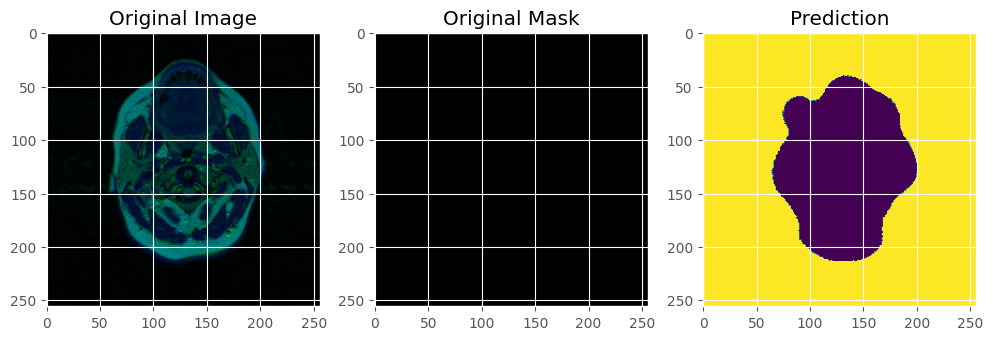

1/1 [==============================] - 0s 30ms/step


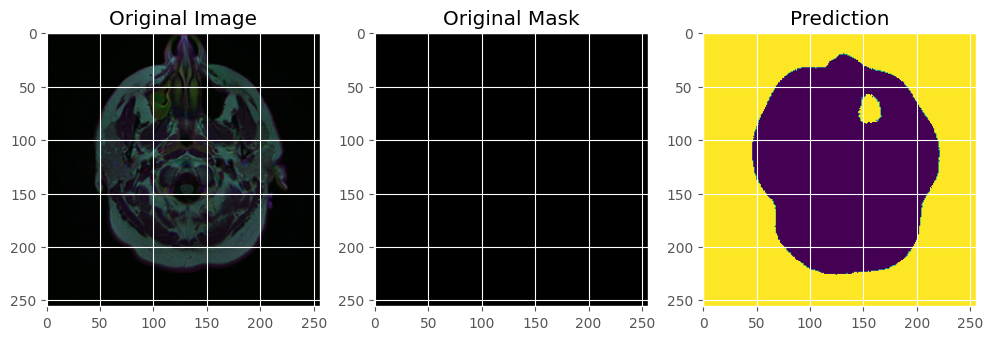

1/1 [==============================] - 0s 30ms/step


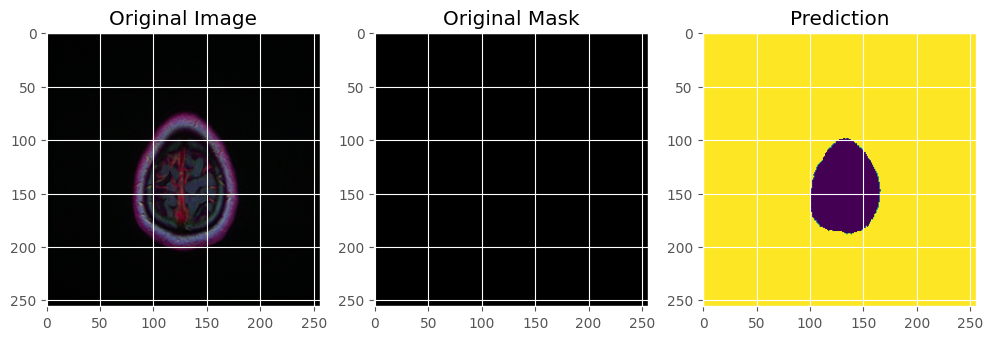

1/1 [==============================] - 0s 28ms/step


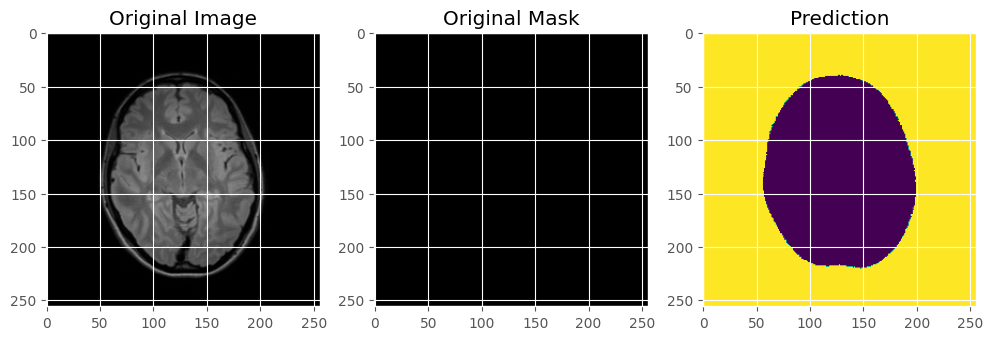

1/1 [==============================] - 0s 27ms/step


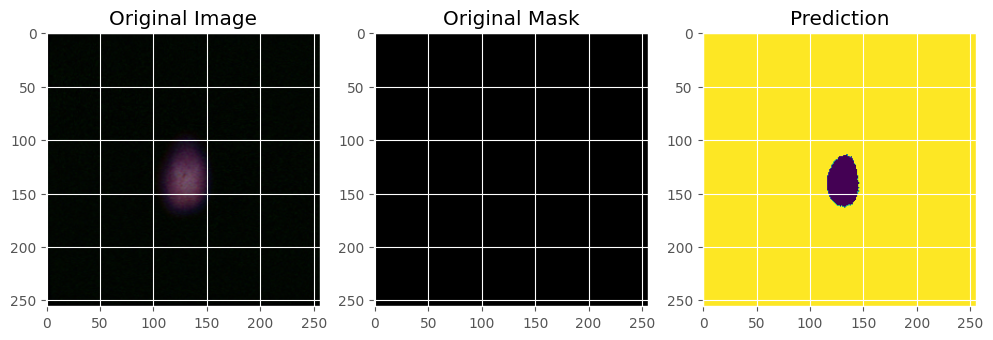

In [26]:
for i in range(100):
    index = np.random.randint(1, len(df_test.index))
    img = cv2.imread(df_test['image_filenames_train'].iloc[index])
    img = cv2.resize(img, (im_height, im_width))
    img = img/255
    # image shape = (256, 256 , 3)

    img = img[np.newaxis, :, :, : ]
    # image shape = (1, 256, 256, 3)

    predicted_img = model.predict(img)
    
    plt.figure(figsize=(12, 12))
    plt.subplot(1, 3, 1)
    plt.imshow(np.squeeze(img))
    plt.title('Original Image')

    plt.subplot(1, 3, 2)
    plt.imshow(np.squeeze(cv2.imread(df_test['mask'].iloc[index])))
    plt.title('Original Mask')

    plt.subplot(1, 3, 3)
    plt.imshow(np.squeeze(predicted_img) > 0.5 )
    plt.title('Prediction')
    plt.show()


My machine learning model's predictions aren't as good as expected. Here are some possible reasons:

1. **Data Issues**: I might not have enough data or it could be of poor quality. I need to gather more data and clean it thoroughly.
2. **Feature Engineering**: My features may not be well-chosen or engineered. I should spend more time creating and selecting meaningful features.
3. **Overfitting/Underfitting**: My model could be too complex (overfitting) or too simple (underfitting). I need to use techniques like cross-validation, regularization, or try different model complexities.
4. **Model Choice**: I might be using the wrong model. I should experiment with different models and tune their hyperparameters.
5. **Data Leakage**: There might be unintended information from the test set in the training data. I need to ensure a proper separation between training and test data.
6. **Evaluation Metrics**: I might be using the wrong metric to evaluate my model. I should choose a metric that aligns with my specific problem.
7. **Preprocessing**: My data preprocessing steps might be flawed. I need to handle missing values, encode categories properly, and standardize or normalize features.

By addressing these issues, I can improve my model's predictions.